In [21]:
# Import Dependencies
from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from statsmodels.tsa.seasonal import seasonal_decompose, STL
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf 
from statsmodels.tsa.statespace.sarimax import SARIMAX 
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.stats.diagnostic import acorr_ljungbox
from pmdarima import auto_arima
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_percentage_error
import statsmodels.api as sm
import seaborn as sns
import math
import itertools
from itertools import product
import warnings

In [4]:
# Defining file paths/reading data with pandas library

hourly_file_path = Path("Resources/saleshourly.csv")
hourly_df = pd.read_csv(hourly_file_path, encoding="ISO-8859-1")

daily_file_path = Path("Resources/salesdaily.csv")
daily_df = pd.read_csv(daily_file_path, encoding="ISO-8859-1")

weekly_file_path = Path("Resources/salesweekly.csv")
weekly_df = pd.read_csv(weekly_file_path, encoding="ISO-8859-1")

monthly_file_path = Path("Resources/salesmonthly.csv")
monthly_df = pd.read_csv(monthly_file_path, encoding="ISO-8859-1")

# Data Preprocessing

In [5]:
# Check for missing values

daily_na = daily_df.isna().sum().sum()
print(daily_na)
weekly_na = weekly_df.isna().sum().sum()
print(weekly_na)

0
0


In [19]:
# Stationary Analysis
# Augmented Dickey Fuller Test

drugs = ['M01AB','M01AE','N02BA','N02BE', 'N05B','N05C','R03','R06']

for drug in drugs:
    test = adfuller(weekly_df[drug], regression='ct', autolag='AIC')
    print(f"{drug}: {test}")
    print(f"p-value: {test[1]}")
    if test[1]<0.05:
        print("Stationary (d=0)\n")
    else:
        print("Non-Stationary (d=/0)\n")

M01AB: (-3.6995553522381677, 0.022386551571704164, 6, 295, {'1%': -3.9897903649837616, '5%': -3.425478311521626, '10%': -3.1358607194990724}, 2000.7374492936378)
p-value: 0.022386551571704164
Stationary (d=0)

M01AE: (-8.71727144826582, 1.5940514680332016e-12, 1, 300, {'1%': -3.98926783537037, '5%': -3.425226747185185, '10%': -3.1357131066666666}, 1888.643041736867)
p-value: 1.5940514680332016e-12
Stationary (d=0)

N02BA: (-2.670227413414101, 0.2486511495539186, 12, 289, {'1%': -3.990441532957606, '5%': -3.425791763669738, '10%': -3.1360446341572343}, 1872.272497392884)
p-value: 0.2486511495539186
Non-Stationary (d=/0)

N02BE: (-4.362038089062473, 0.002515571533894829, 1, 300, {'1%': -3.98926783537037, '5%': -3.425226747185185, '10%': -3.1357131066666666}, 2977.4174460026284)
p-value: 0.002515571533894829
Stationary (d=0)

N05B: (-3.781694485425939, 0.017510453247195662, 4, 297, {'1%': -3.9895792190177497, '5%': -3.4253766620686186, '10%': -3.135801074760346}, 2463.1101940709295)
p-val

In [18]:
# Differencing to make stationary
# Augmented Dickey Fuller Test

df_diff = np.diff(weekly_df['N02BA'], n=1)
adf_result = adfuller(df_diff, regression='ct', autolag='AIC')
print(f"N02BA: {adf_result}")
print(f"p-value: {adf_result[1]}")
if adf_result[1]<0.05:
    print("Stationary\nd=1")
else:
    print("Still Non-Stationary\n")

N02BA: (-9.179471799280835, 1.4315901251013519e-13, 11, 289, {'1%': -3.990441532957606, '5%': -3.425791763669738, '10%': -3.1360446341572343}, 1869.3459720981925)
p-value: 1.4315901251013519e-13
Stationary
d=1


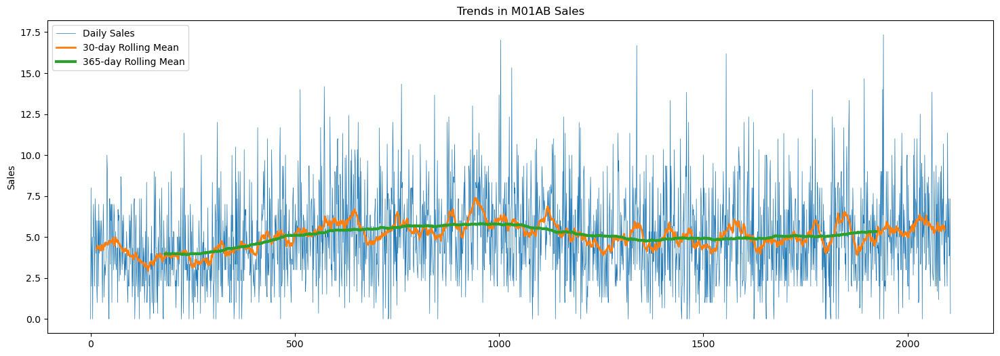

In [7]:
# Rolling Window Means (M01AB)

drug1 = 'M01AB'
daily_30 = daily_df[drug1].rolling(window=30, center=True).mean()
daily_365 = daily_df[drug1].rolling(window=365, center=True).mean()

fig, ax = plt.subplots(figsize=(18, 6))

ax.plot(daily_df[drug1], linewidth=0.5, label='Daily Sales')
ax.plot(daily_30, linewidth=2, label='30-day Rolling Mean')
ax.plot(daily_365, linewidth=3, label='365-day Rolling Mean')
ax.set_ylabel('Sales')
ax.legend()
ax.set_title(f'Trends in M01AB Sales')
folder_path = 'Time_Series_Visualizations'
plt.savefig(f"{folder_path}/Rolling_Window_M01AB.png") 
plt.show()

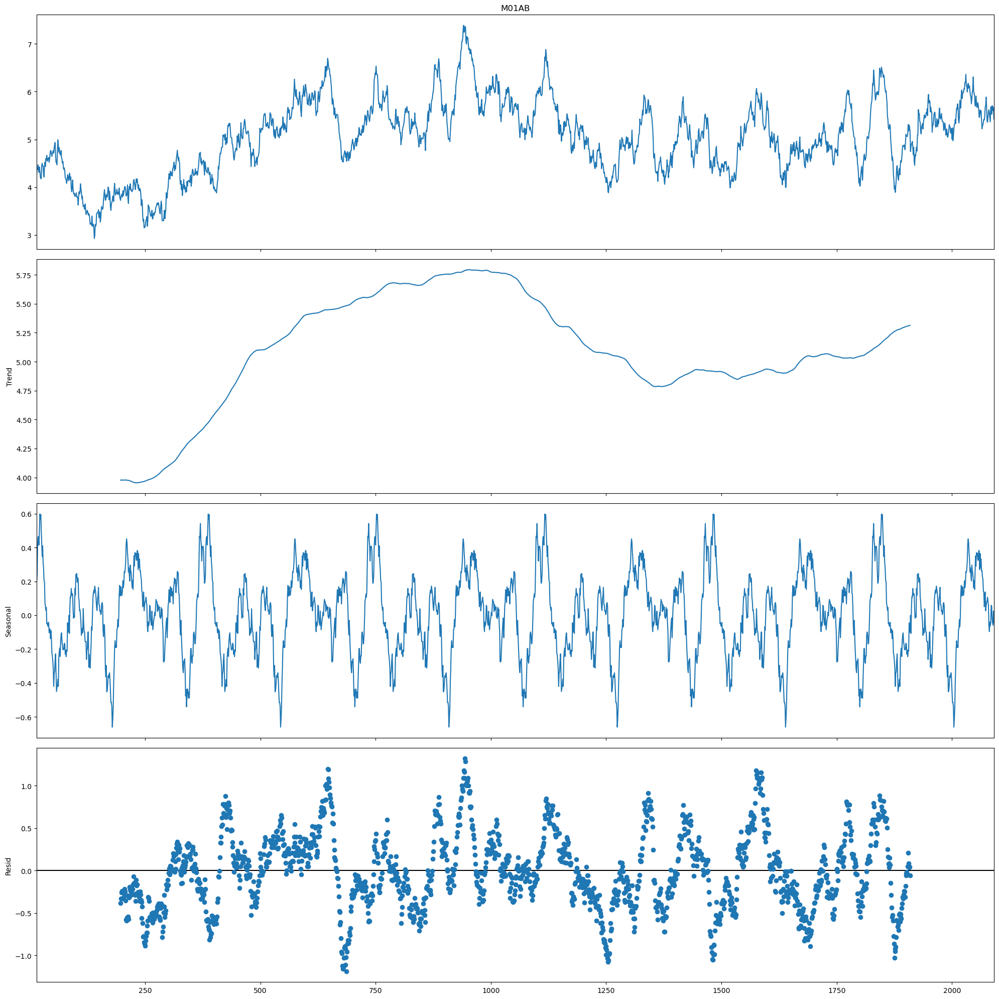

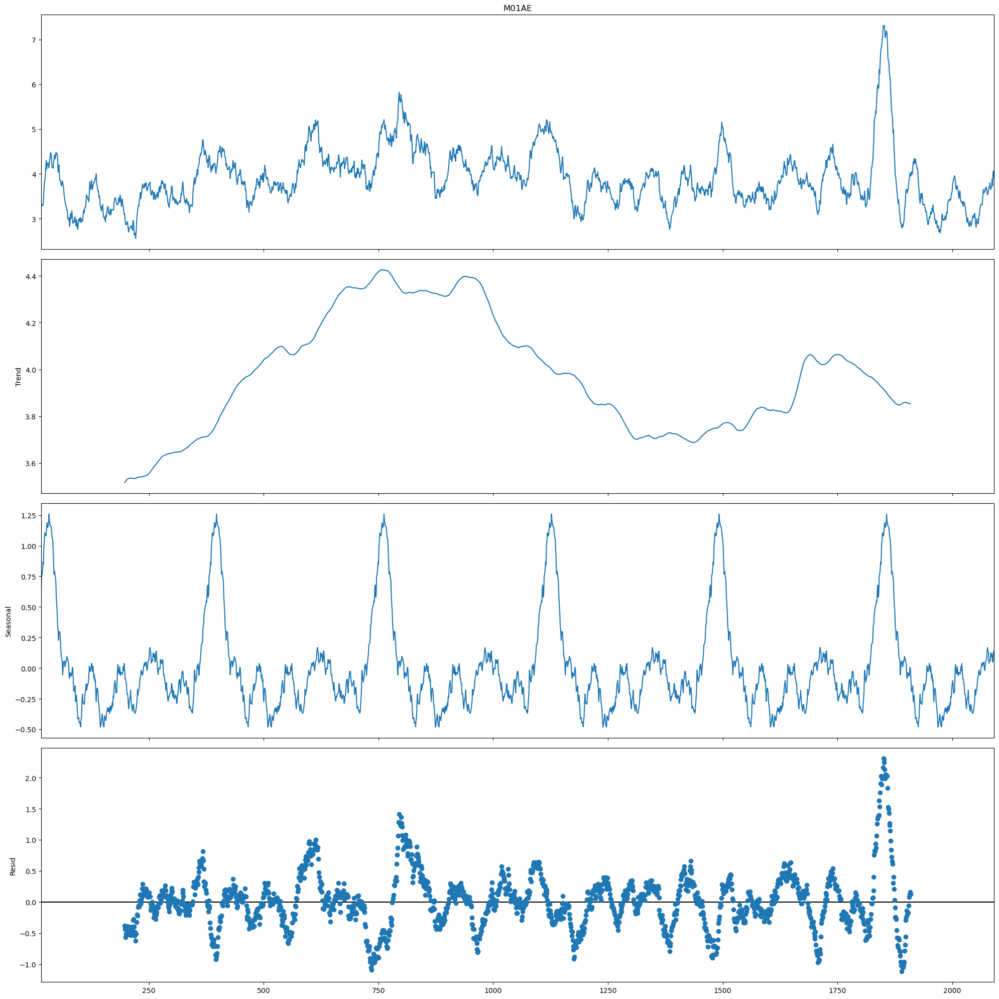

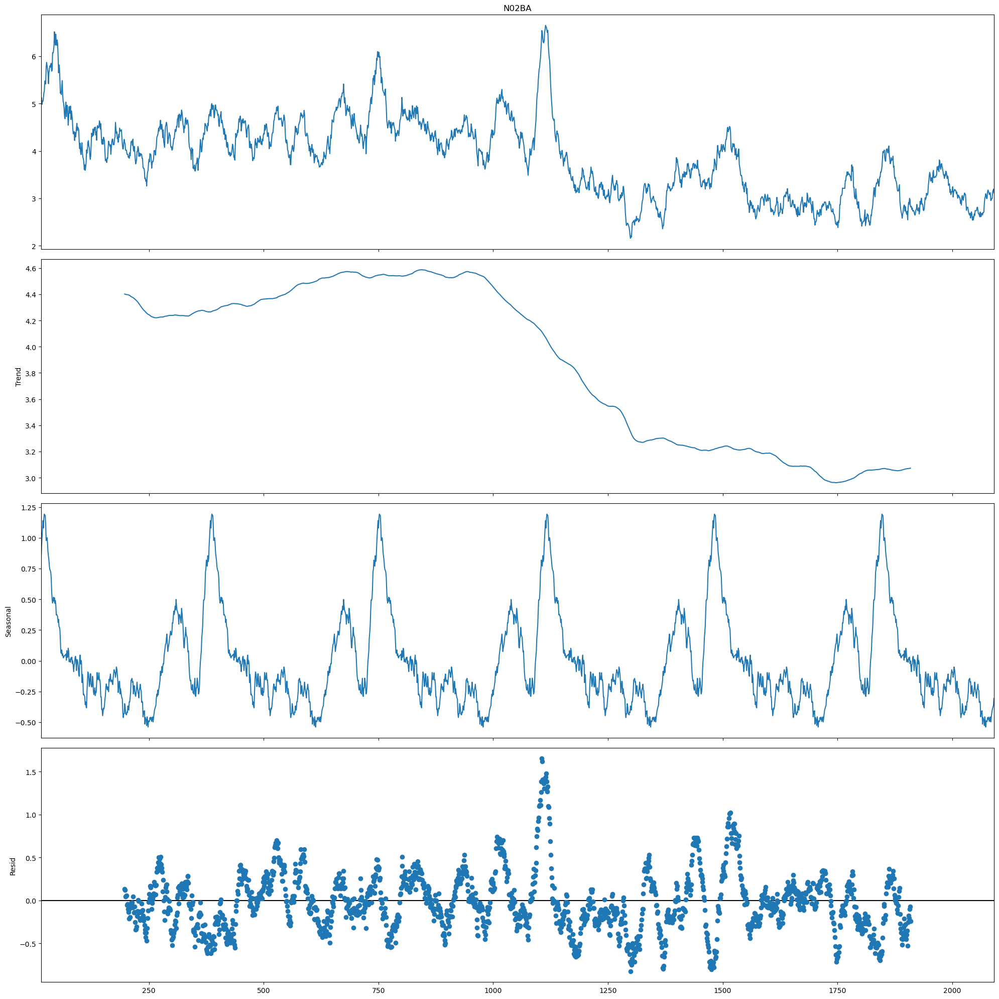

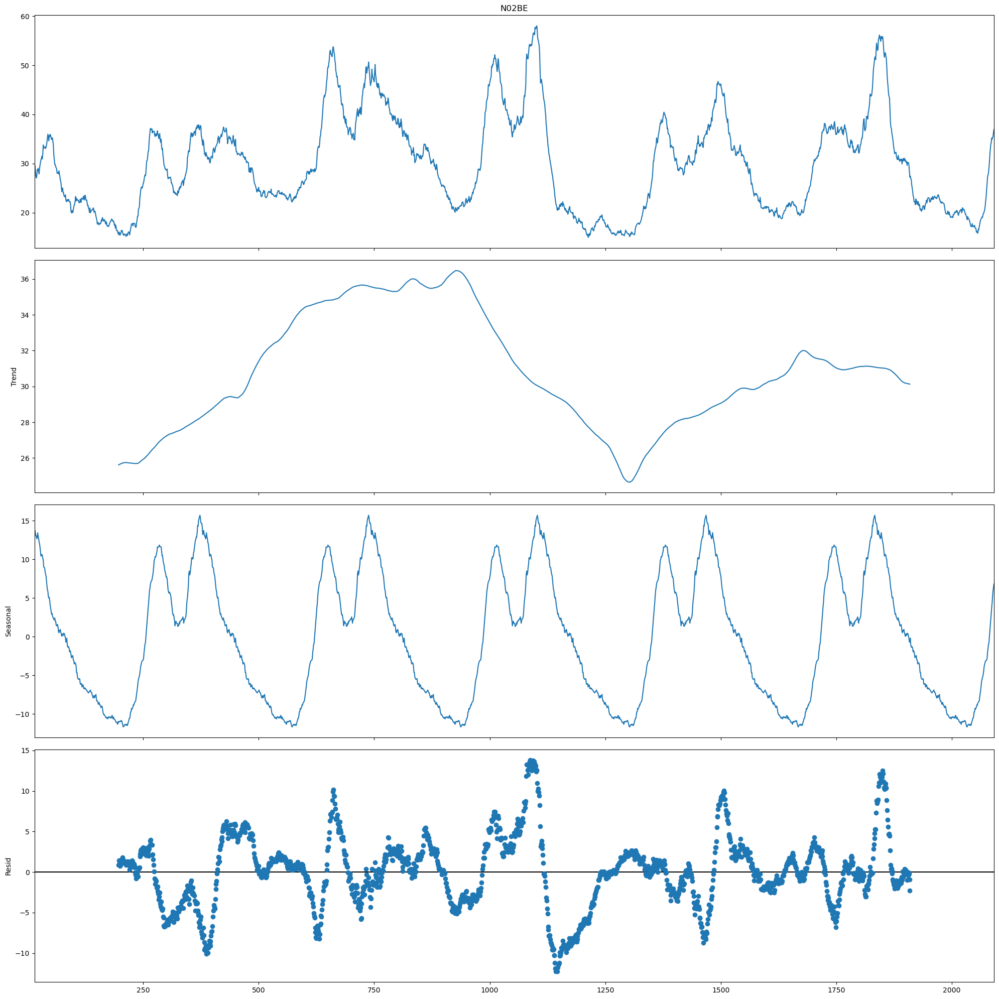

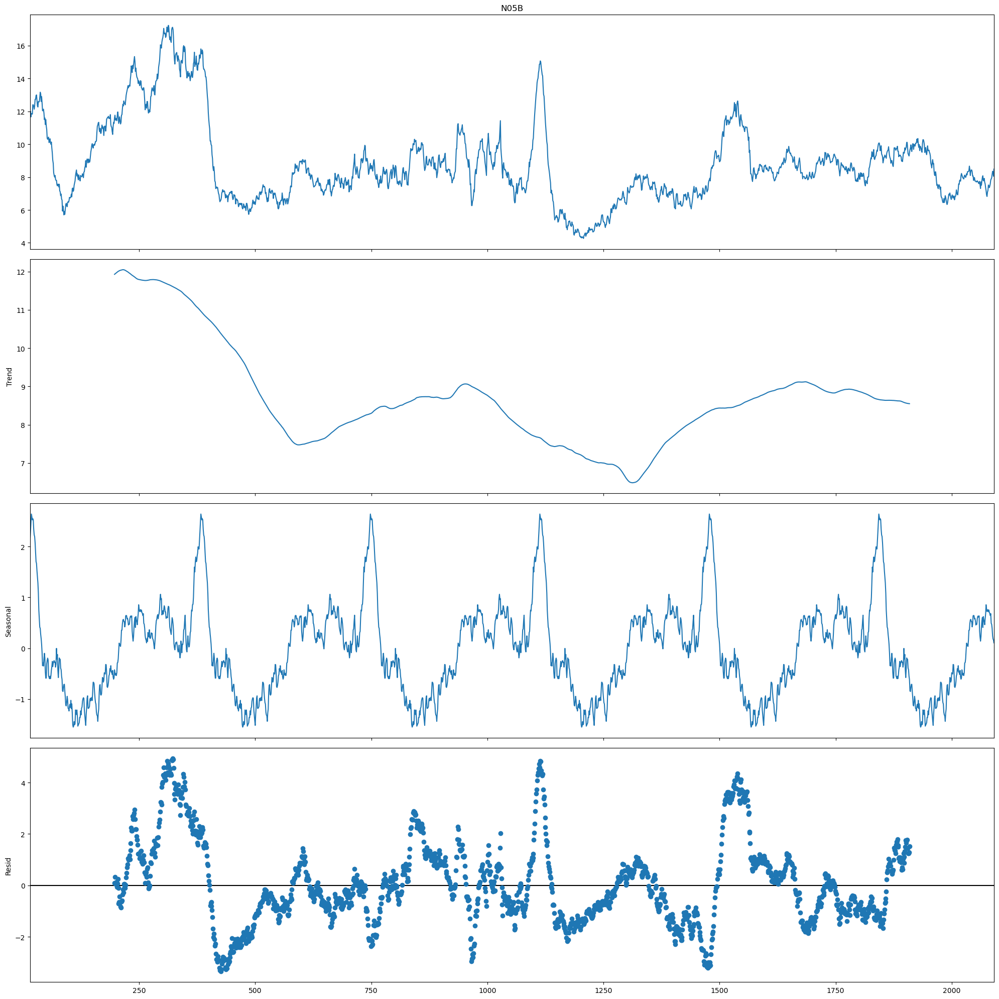

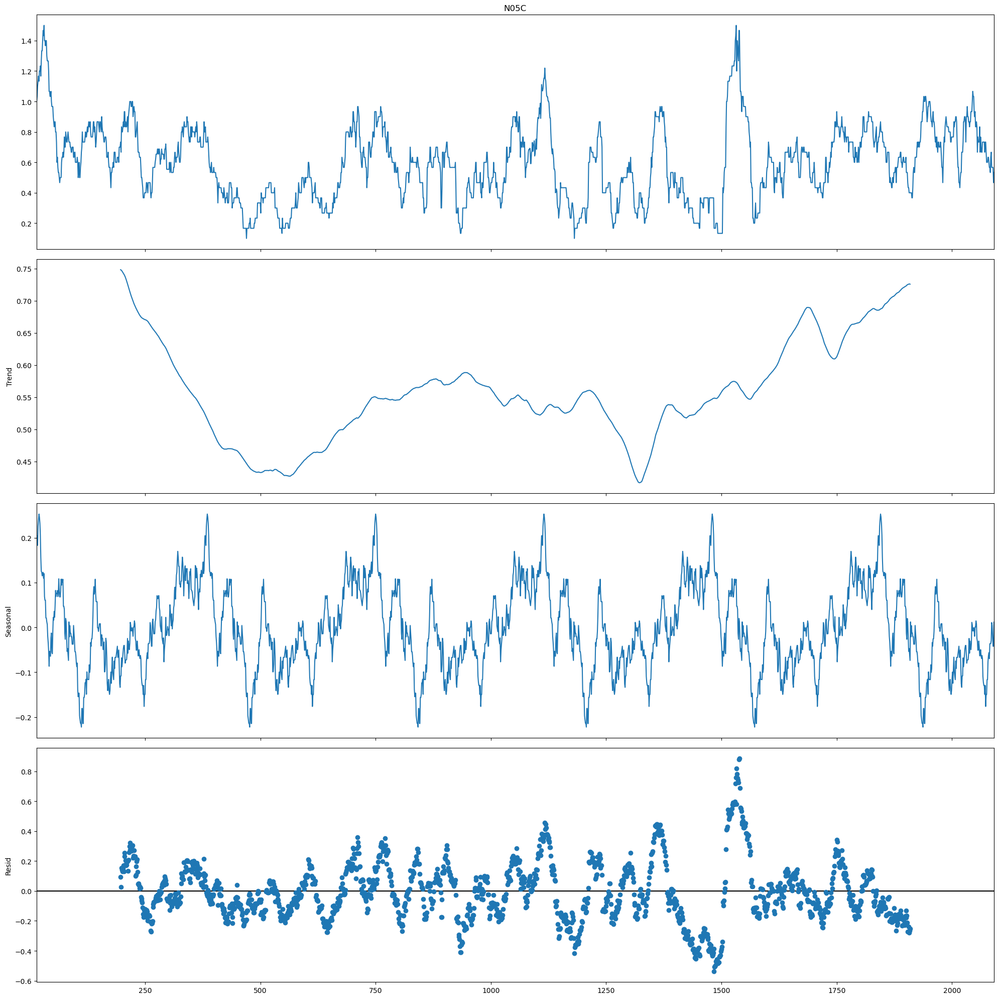

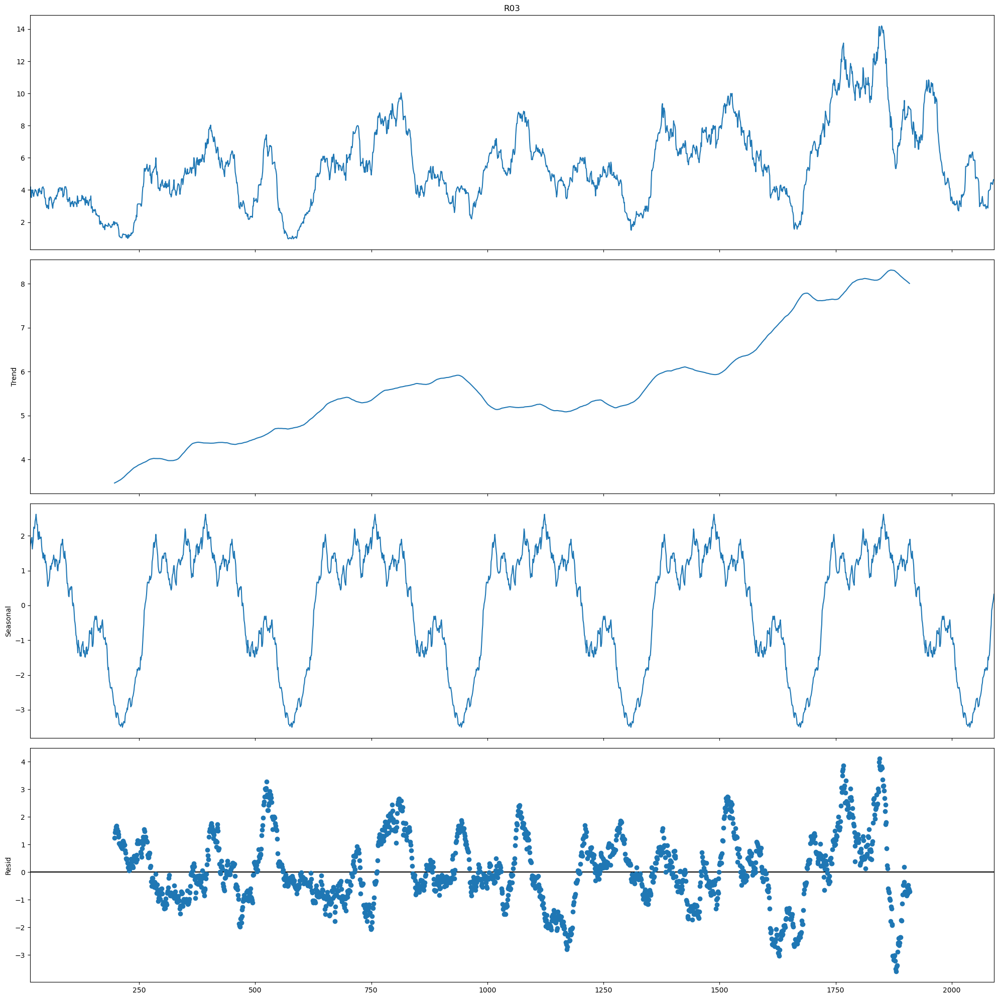

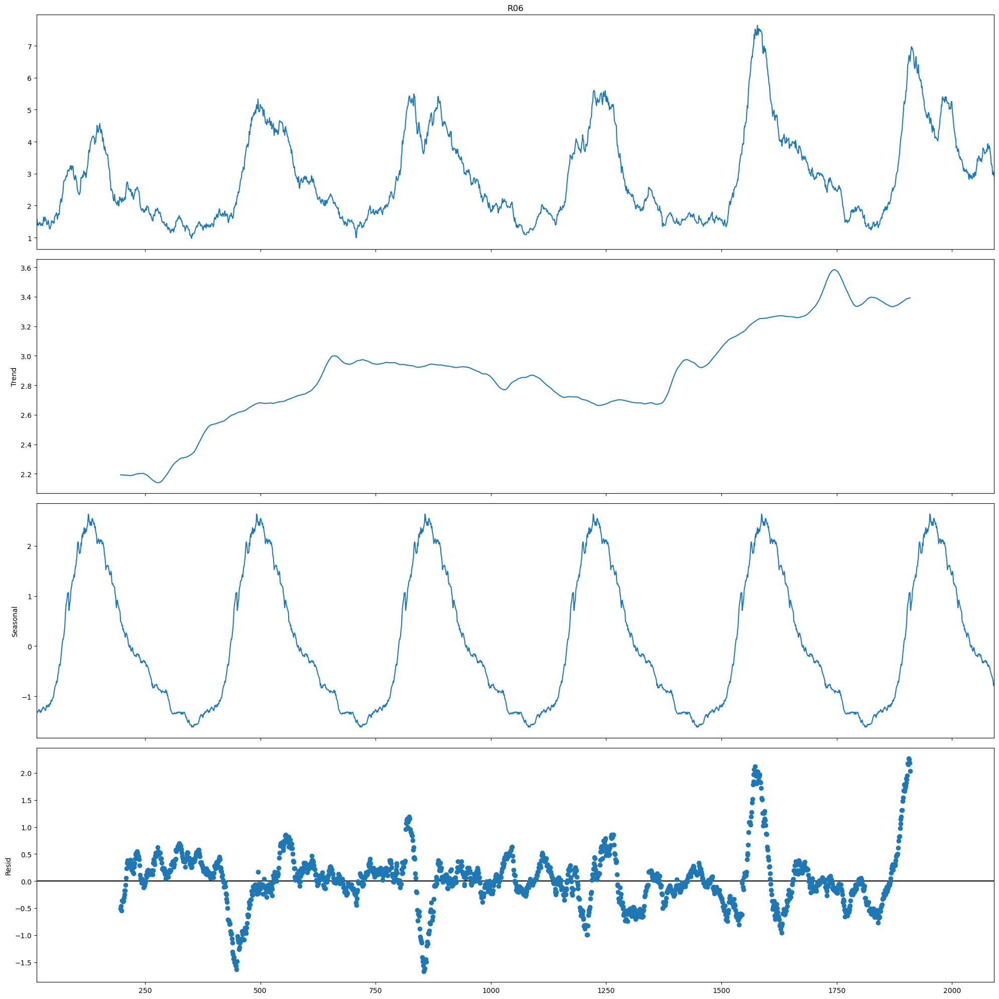

In [8]:
# Seasonal decomposition based on 30 day rolling means

drugs = ['M01AB','M01AE','N02BA','N02BE', 'N05B','N05C','R03','R06']

for drug in drugs:
    result = seasonal_decompose(daily_df[drug].rolling(window=30, center=True).mean().dropna(), period=365, model='additive')
    plt.rcParams["figure.figsize"] = (20,20)
    result.plot()
    plt.savefig(f"{folder_path}/Seasonal_Decomp_{drug}.png") 
    plt.show()

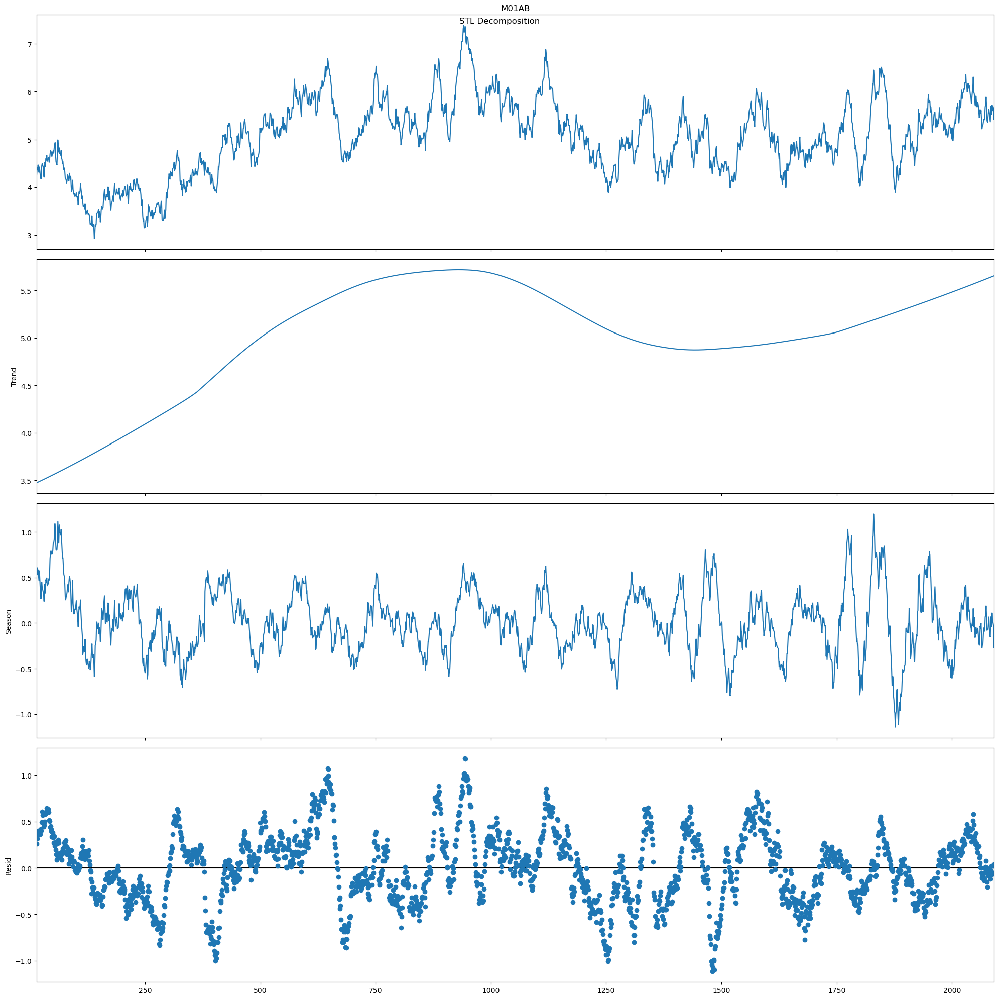

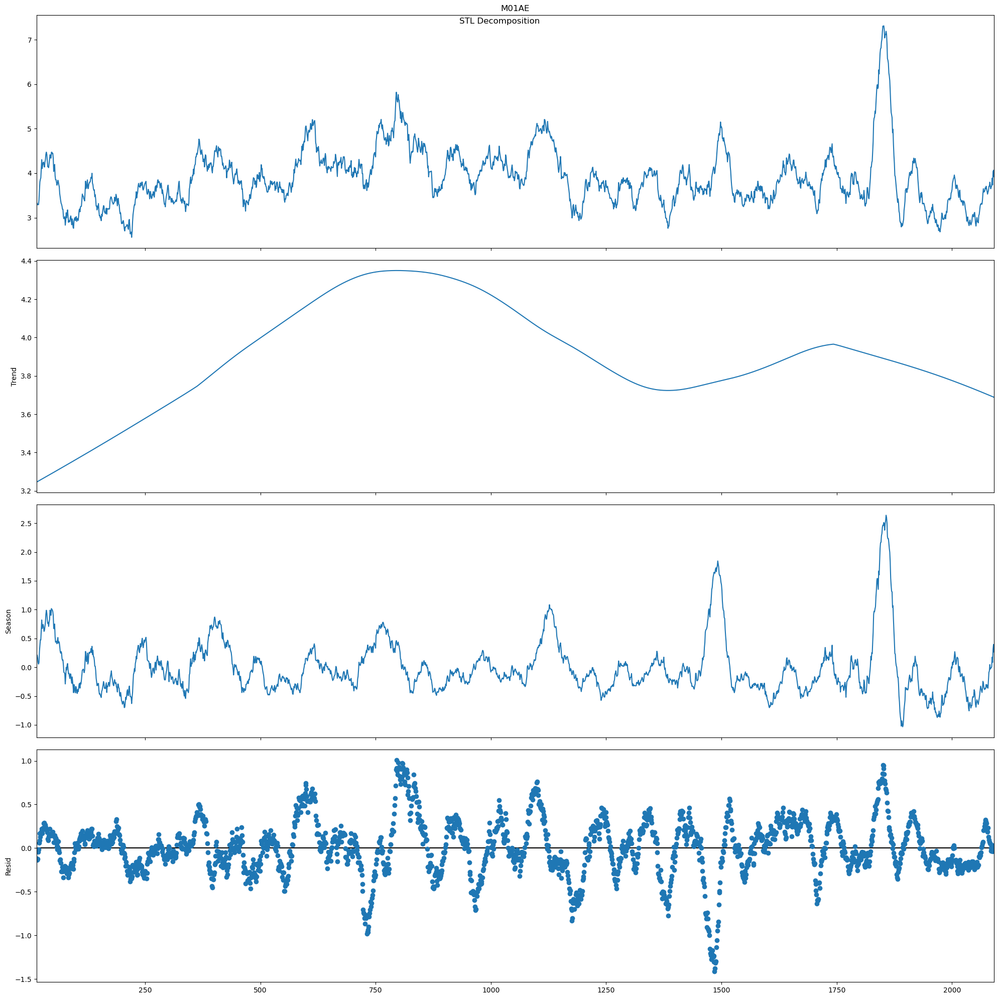

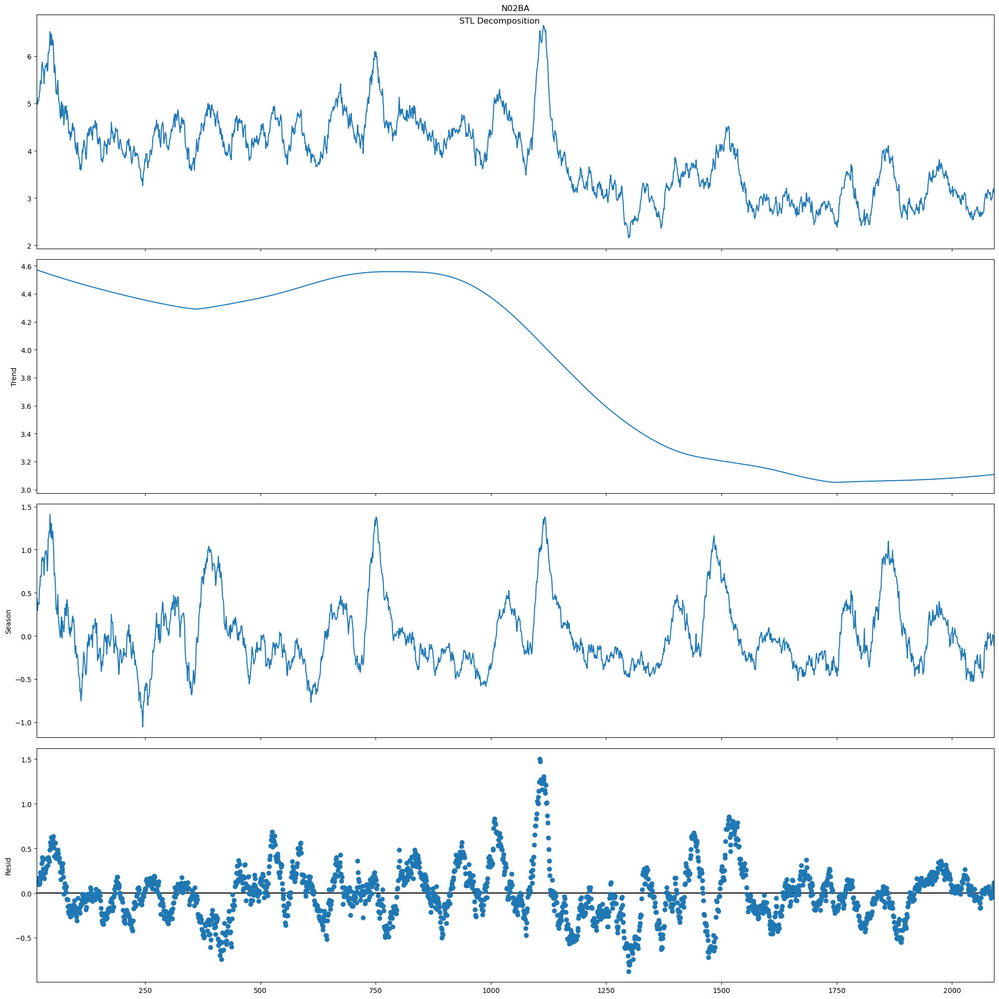

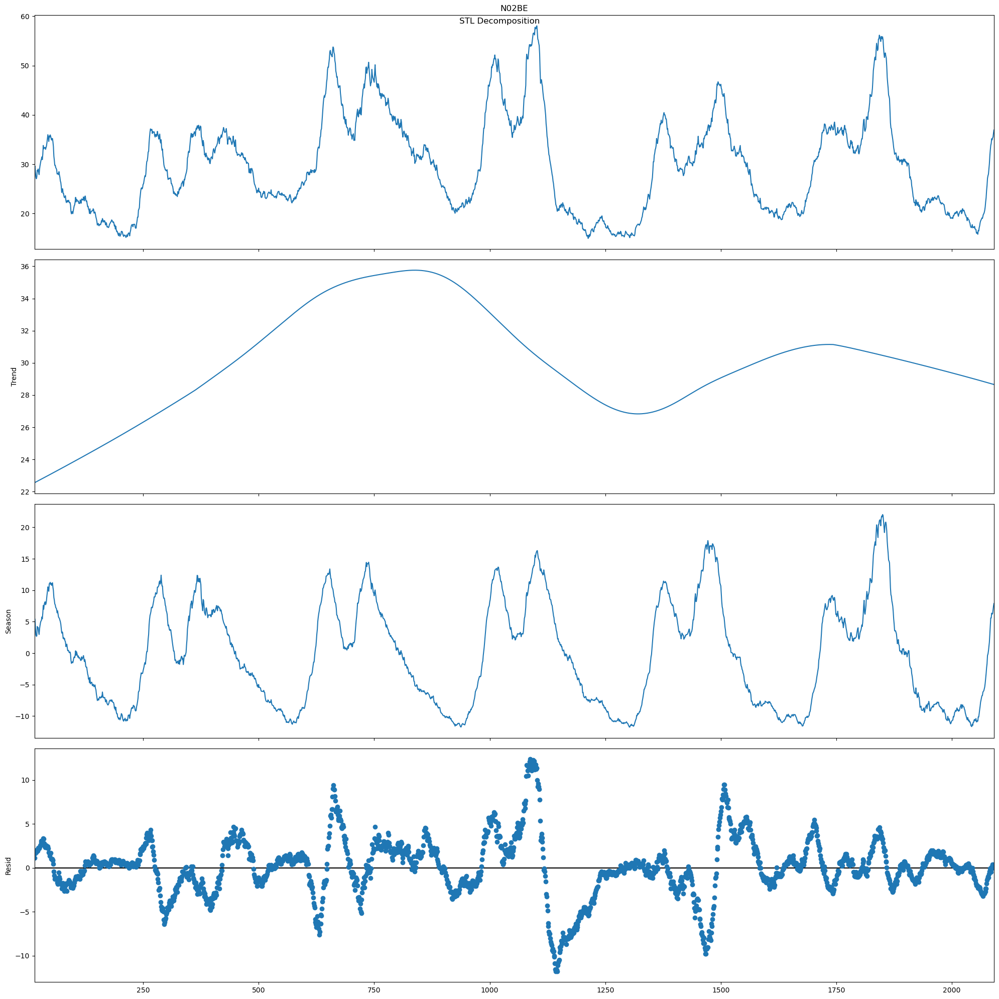

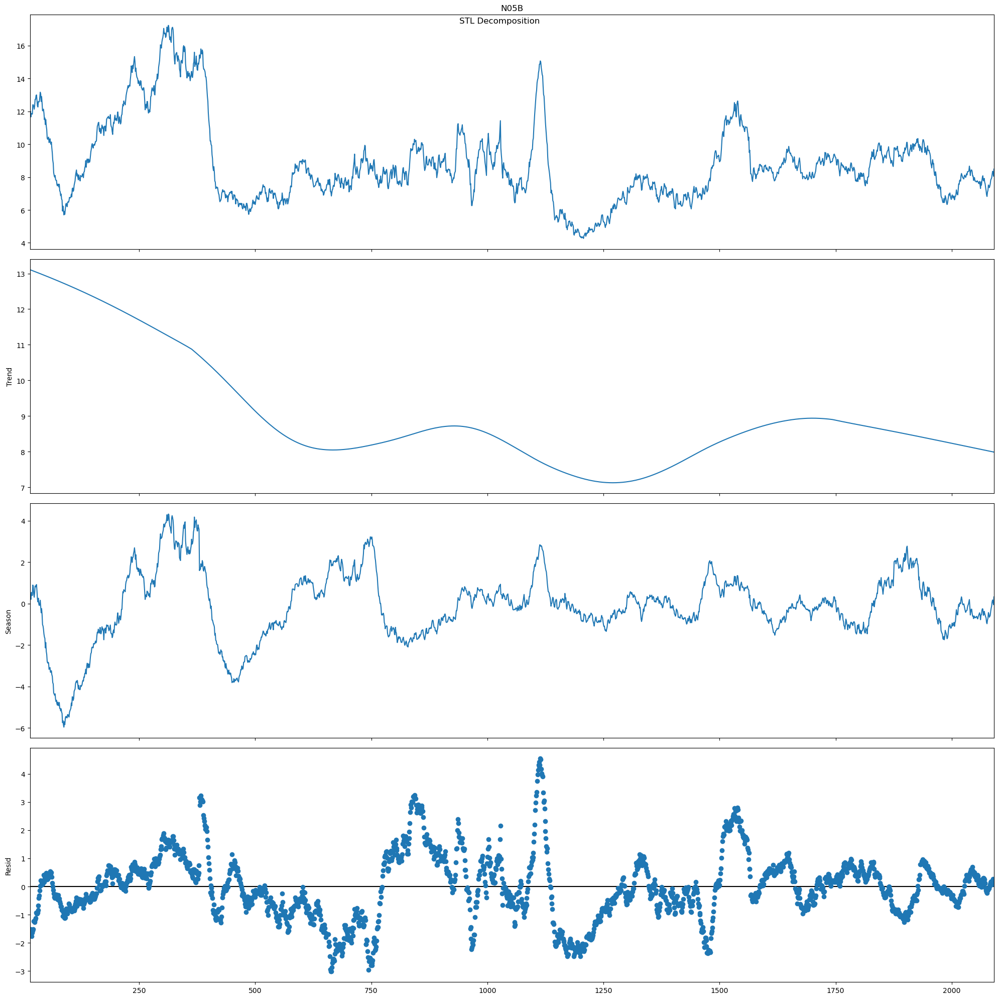

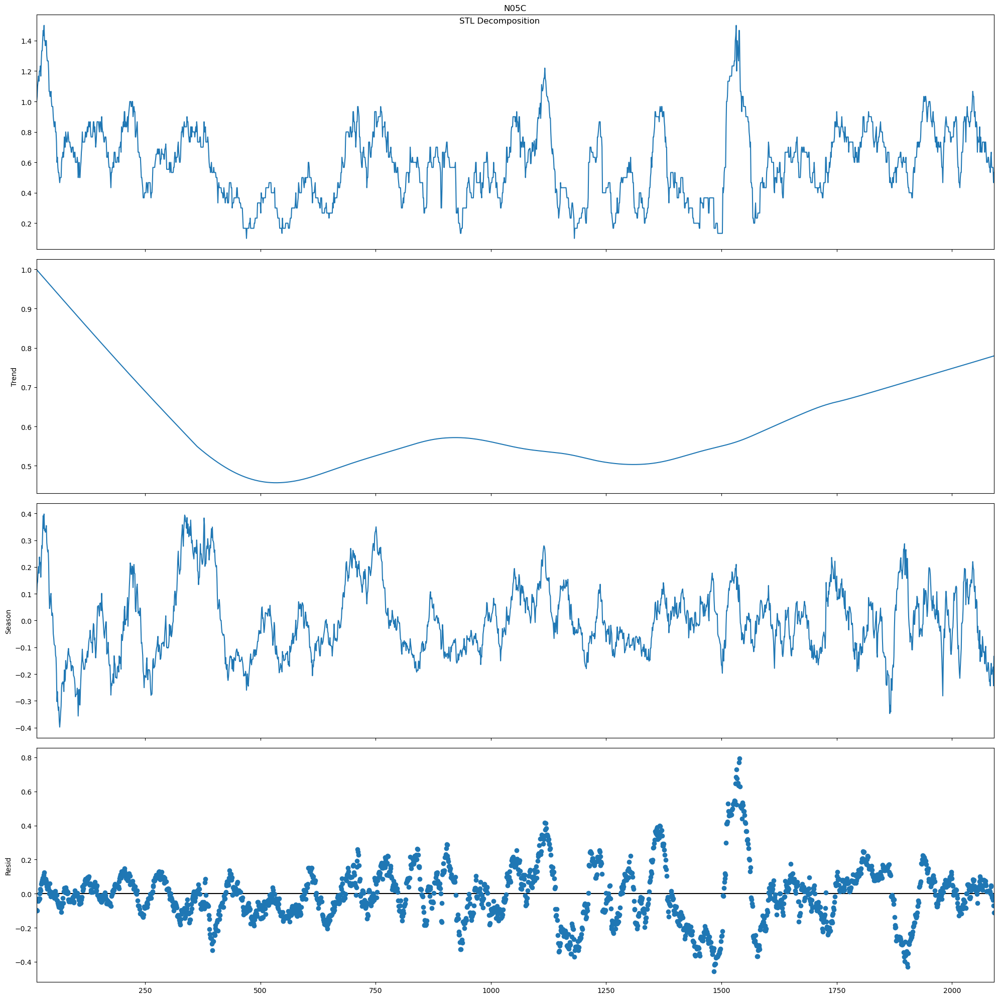

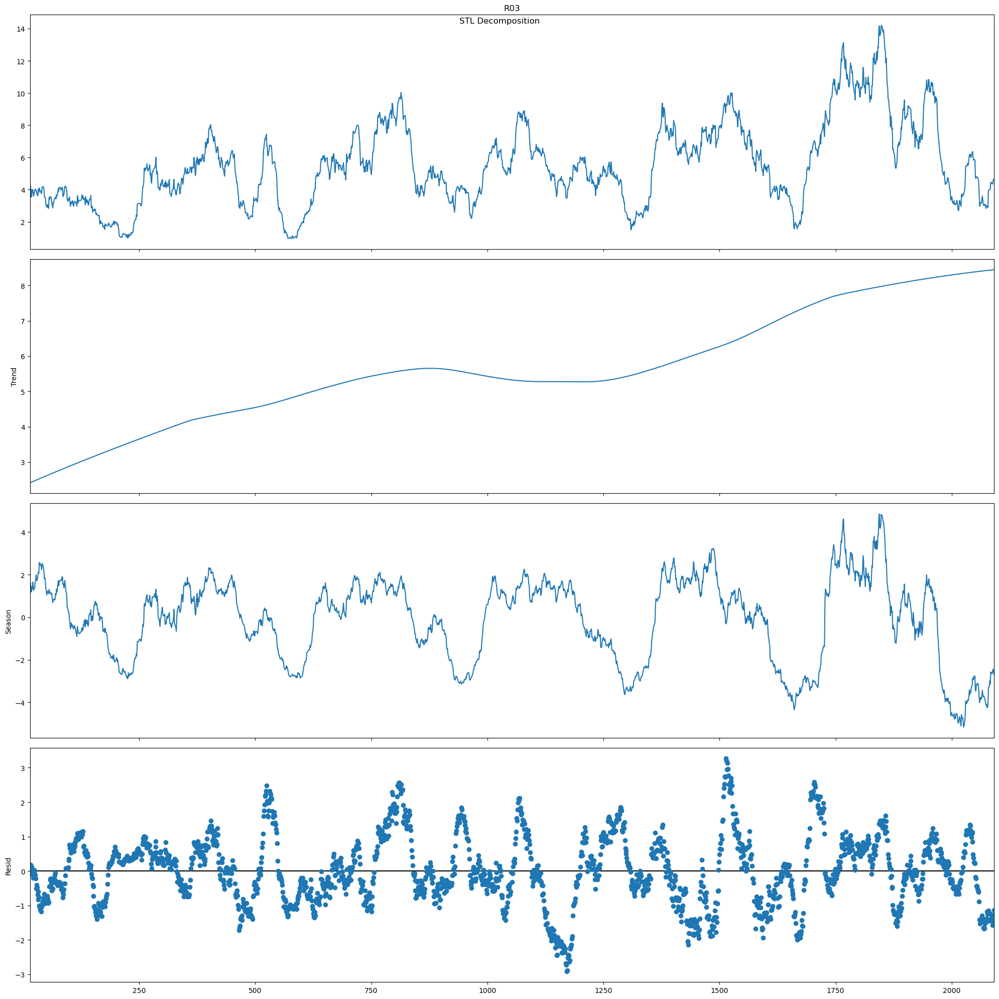

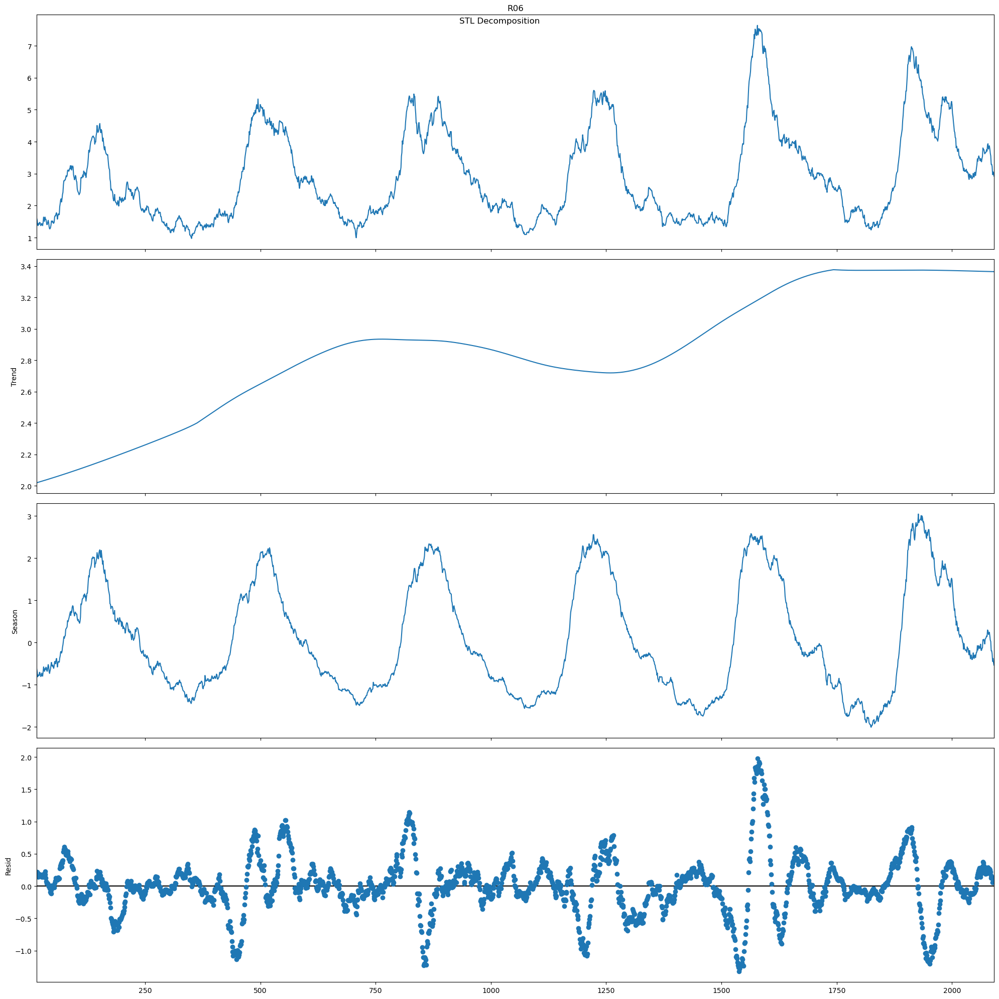

In [9]:
# Seasonal-Trend Decomposition based on 30 day rolling means

for drug in drugs:
    result = STL(daily_df[drug].rolling(window=30, center=True).mean().dropna(), period=365).fit()
    plt.rcParams["figure.figsize"] = (20,20)
    result.plot().suptitle("STL Decomposition")
    plt.savefig(f"{folder_path}/Seasonal_Trend_Decomp_{drug}.png") 

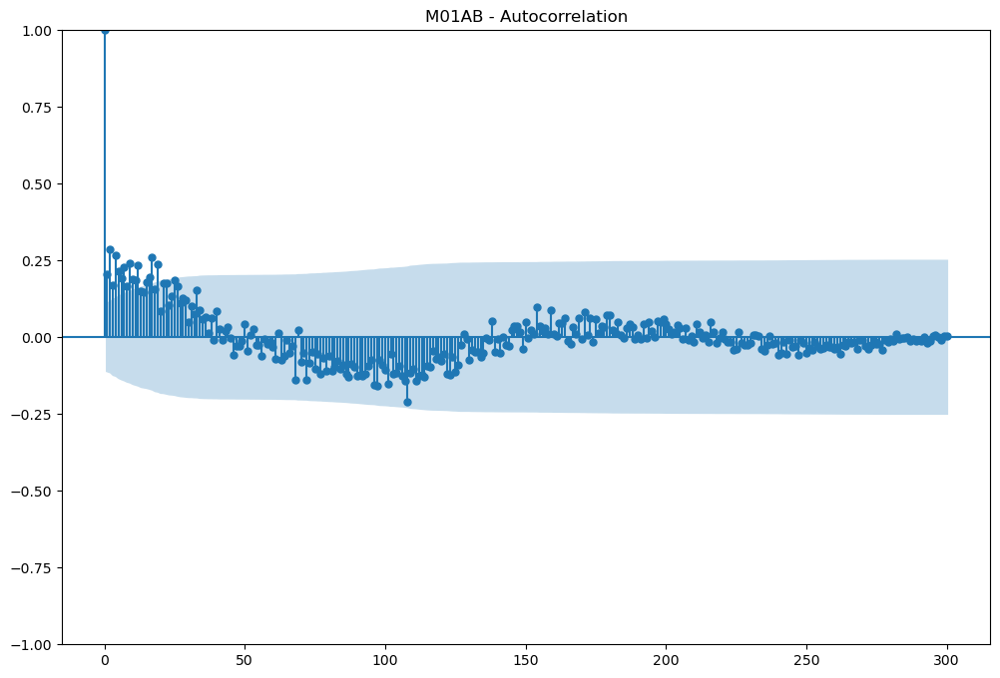

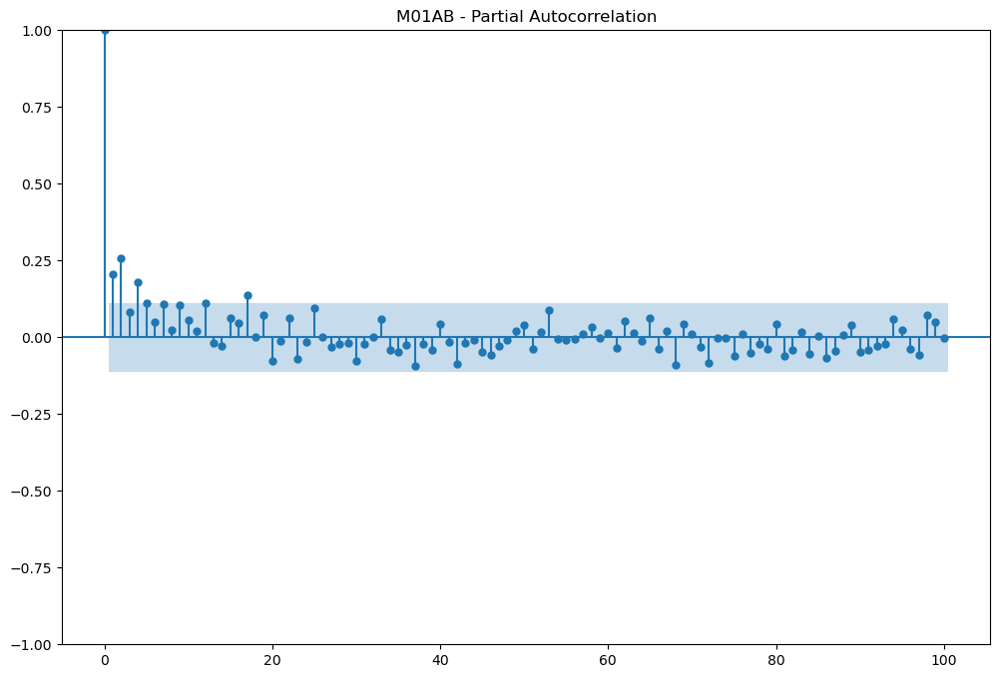

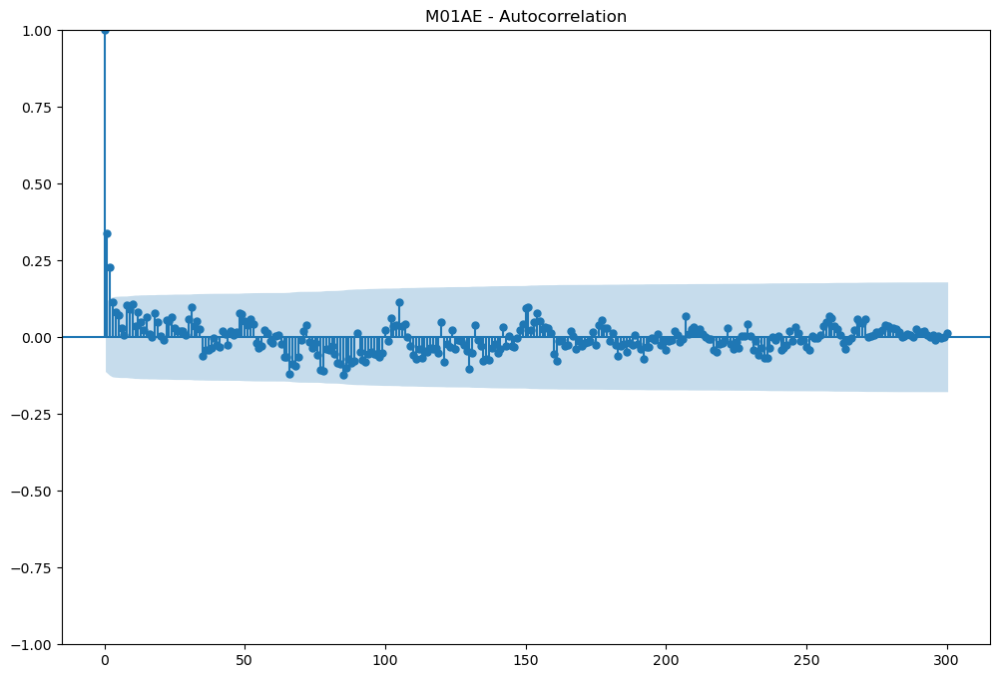

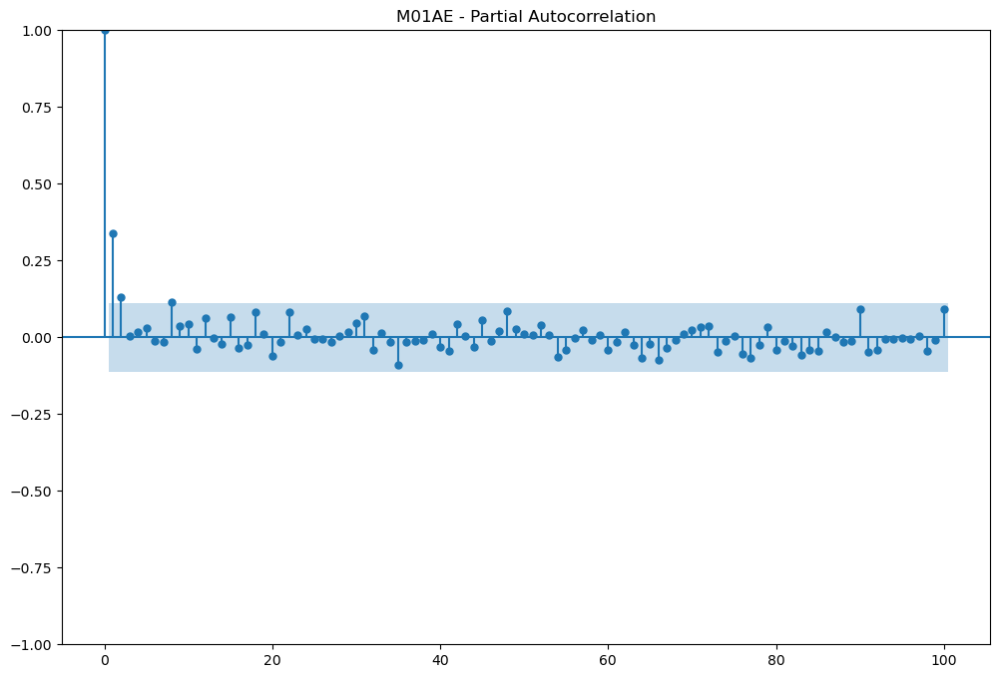

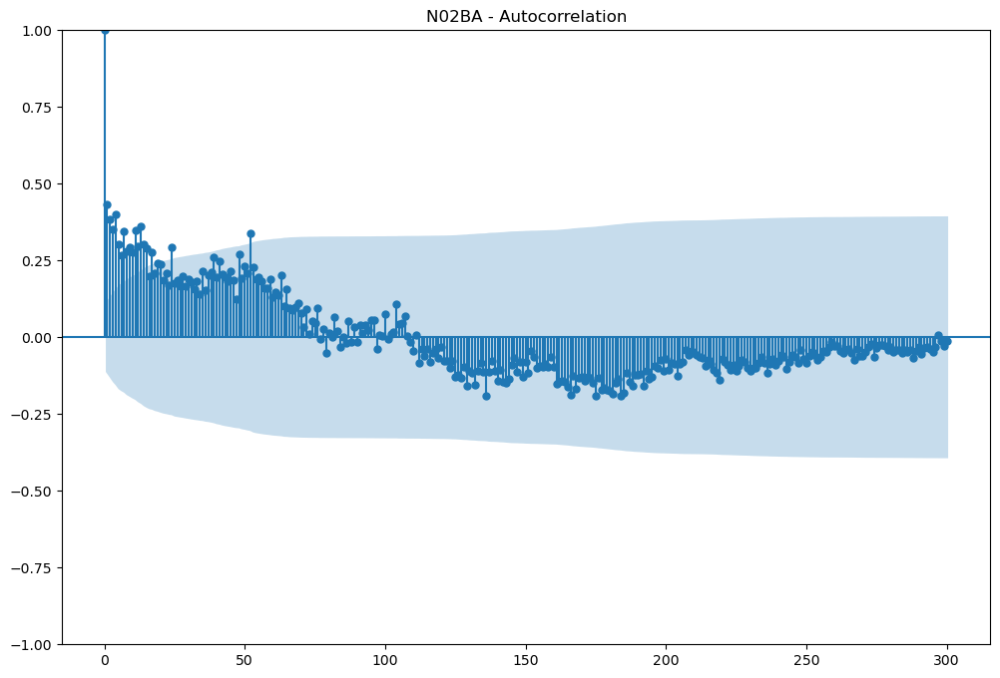

...

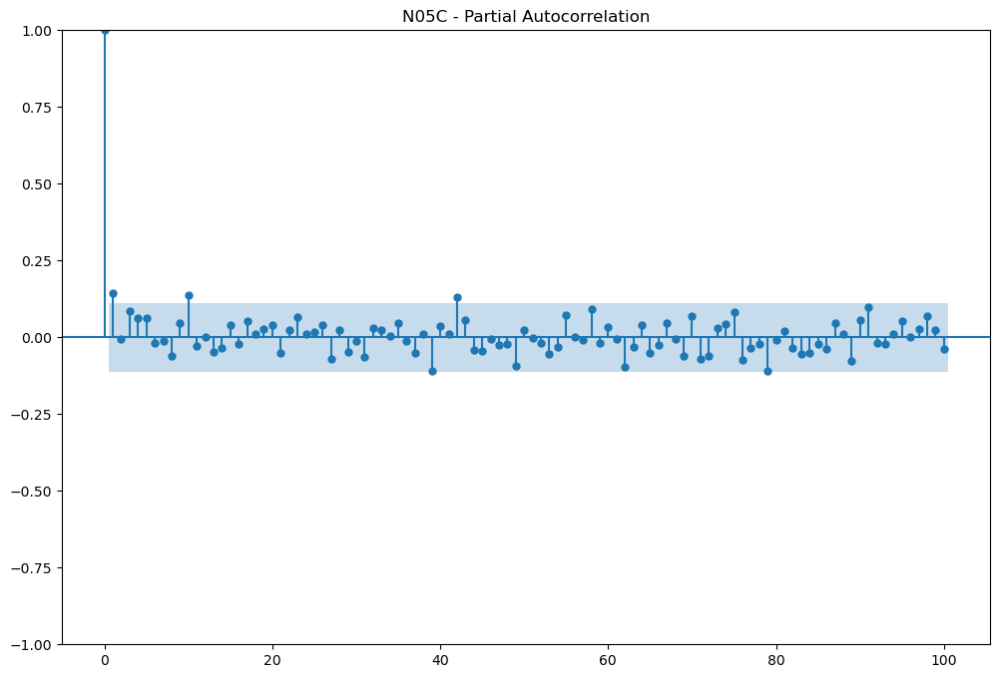

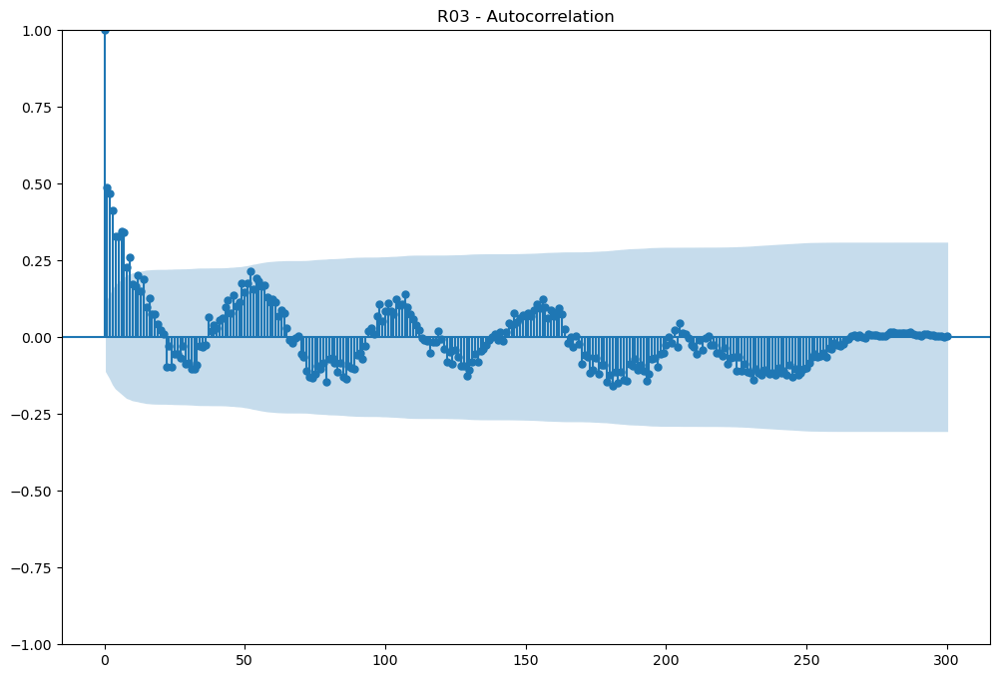

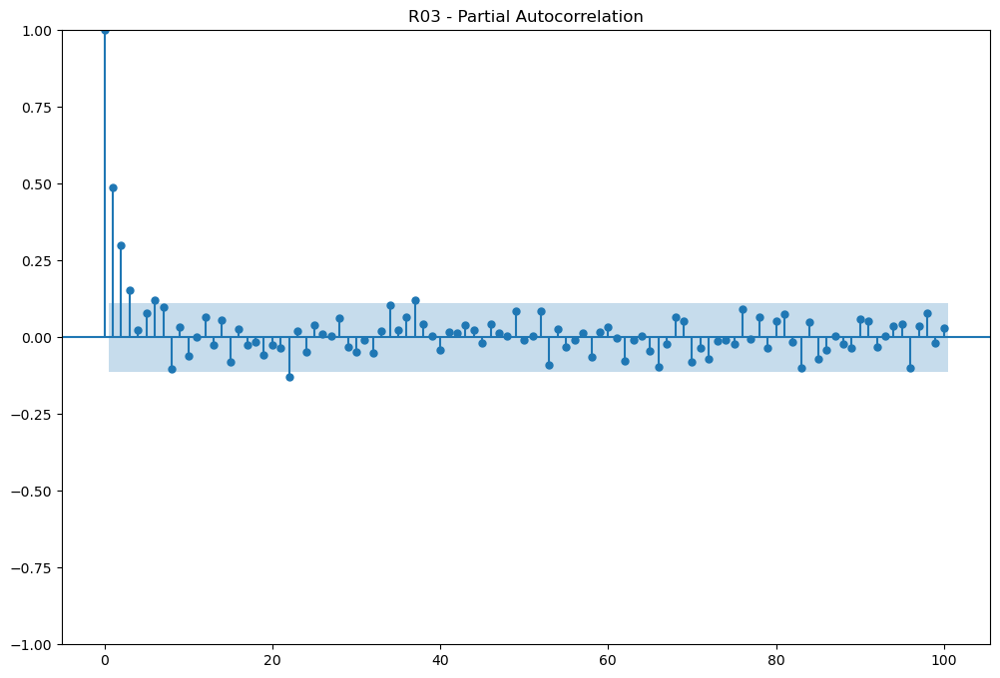

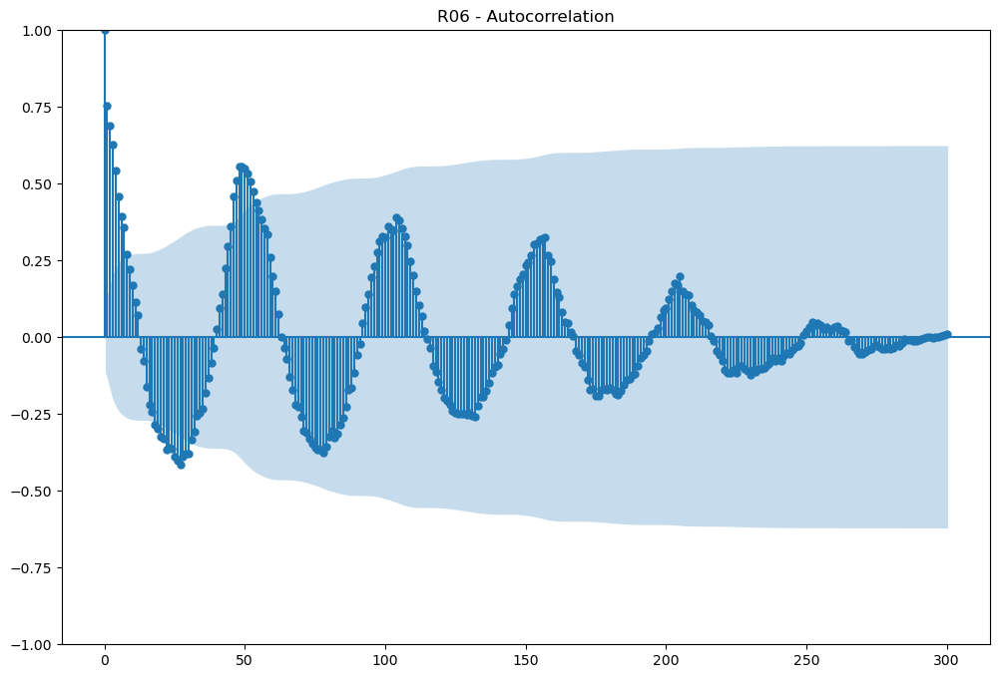

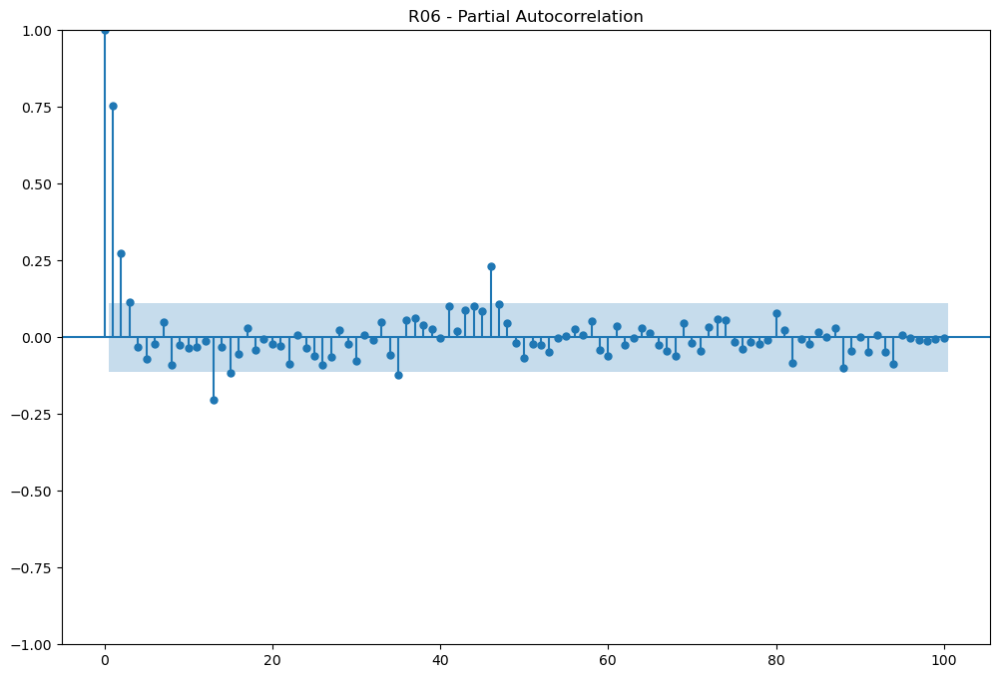

In [10]:
# Plot ACF and PACF

for drug in drugs:
    plt.rcParams["figure.figsize"] = (12,8)
    plot_acf(weekly_df[drug], lags=300) 
    plt.title(f"{drug} - Autocorrelation")
    plt.savefig(f"{folder_path}/ACF_{drug}.png") 
    plot_pacf(weekly_df[drug], lags=100) 
    plt.title(f"{drug} - Partial Autocorrelation")
    plt.savefig(f"{folder_path}/PACF_{drug}.png") 
    plt.show()

# Determine Parameters

In [3]:
def evaluate_arima_model(X, arima_order):
    size = int(len(X) * 0.66)
    train, test = X[0:size], X[size:]
    history = [x for x in train]

    predictions = list()
    for t in range(len(test)):
        model = ARIMA(history, order=arima_order)
        model_fit = model.fit()
        yhat = model_fit.forecast()[0]
        predictions.append(yhat)
        history.append(test[t])

    mse = mean_squared_error(test, predictions)
    return mse

def evaluate_models(drug, dataset, p_values, d_values, q_values):
    best_score, best_cfg = float("inf"), None
    for p in p_values:
        for d in d_values:
            for q in q_values:
                order = (p,d,q)
                try:
                    mse = evaluate_arima_model(dataset, order)
                    if mse < best_score:
                        best_score, best_cfg = mse, order
                except:
                    continue
    print(drug+': Best ARIMA%s MSE=%.3f' % (best_cfg, best_score))

p_values = range(0, 6)
d_values = range(0, 1)
q_values = range(0, 6)

warnings.filterwarnings("ignore")

for drug in ['M01AB','M01AE','N02BA','N02BE','N05B','N05C','R03','R06']:
    evaluate_models(drug, weekly_df[drug].values, p_values, d_values, q_values)

M01ABBest ARIMA(0, 0, 0) MSE=61.971
M01AEBest ARIMA(2, 0, 0) MSE=54.293
N02BABest ARIMA(2, 1, 4) MSE=29.043
N02BEBest ARIMA(2, 0, 0) MSE=2080.803
N05BBest ARIMA(0, 0, 5) MSE=195.061
N05CBest ARIMA(0, 0, 1) MSE=11.383
R03Best ARIMA(4, 1, 5) MSE=505.479
R06Best ARIMA(5, 0, 5) MSE=67.772


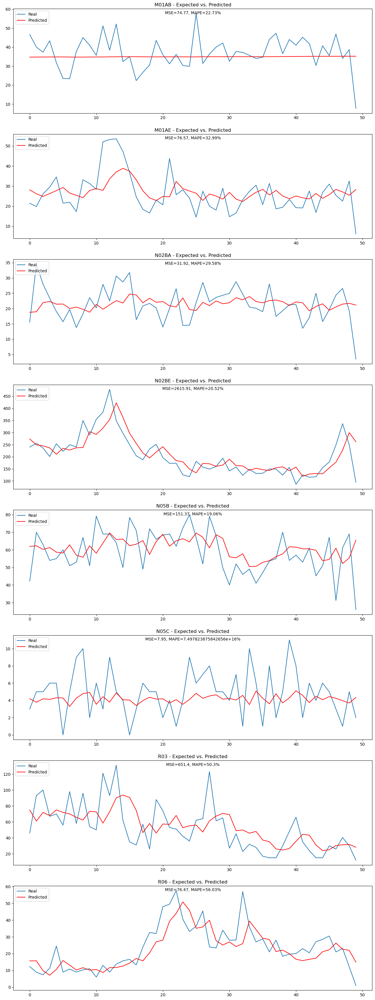

In [11]:
M01AB= ['M01AB',0,0,0]
M01AE= ['M01AE',2,0,0]
N02BA= ['N02BA',2,1,4]
N02BE= ['N02BE',2,0,0]
N05B= ['N05B',0,0,5]
N05C= ['N05C',0,0,1]
R03= ['R03',4,1,5]
R06= ['R06',5,0,5]

drugs_list = [M01AB,M01AE,N02BA,N02BE,N05B,N05C,R03,R06]
error_metrics_df = pd.DataFrame(columns=['Drug_Classification', 'ARIMA_MSE', 'ARIMA_MAPE', 'Auto-ARIMA_MSE', 'Auto-ARIMA_MAPE'])
model_fits = {}
subplotindex=0
fig, ax = plt.subplots(8, 1, figsize=(16,44))

warnings.filterwarnings("ignore")

for drug in drugs_list:
    X = weekly_df[drug[0]].values
    size = len(X)-50
    train, test = X[0:size], X[size:len(X)]
    history = [x for x in train]
    predictions = list()
    for t in range(len(test)):
        model = ARIMA(history, order=(drug[1],drug[2],drug[3]))
        model_fit = model.fit()
        output = model_fit.forecast()
        yhat = output[0]
        predictions.append(yhat)
        obs = test[t]
        history.append(obs)
    mse = mean_squared_error(test, predictions)
    mape = (mean_absolute_percentage_error(test, predictions))*100

    new_row = pd.DataFrame({'Drug_Classification': [drug[0]], 'ARIMA_MSE': [mse], 'ARIMA_MAPE': [mape]})
    error_metrics_df = pd.concat([error_metrics_df, new_row], ignore_index=True)

    model_fits[drug[0]] = model_fit

    ax[subplotindex].set_title(drug[0]+' - Expected vs. Predicted')
    ax[subplotindex].text(0.5, 0.96, 'MSE=' + str(round(mse, 2)) + ', MAPE=' + str(round(mape, 2)) + '%',
                            ha='center', va='center', transform=ax[subplotindex].transAxes,
                            fontsize=10)
    ax[subplotindex].plot(test, label='Real')
    ax[subplotindex].plot(predictions, color='red', label='Predicted')
    ax[subplotindex].legend(loc='upper left')
    subplotindex+=1
plt.savefig(f"{folder_path}/ARIMA_expected_vs_predicted.png") 
plt.show()

Summary - M01AB
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  301
Model:                          ARIMA   Log Likelihood               -1070.207
Date:                Wed, 16 Oct 2024   AIC                           2144.414
Time:                        01:03:26   BIC                           2151.828
Sample:                             0   HQIC                          2147.381
                                - 301                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         35.1936      0.508     69.288      0.000      34.198      36.189
sigma2        71.7462      5.681     12.629      0.000      60.612      82.881
Ljung-Box (L1) (Q):                 

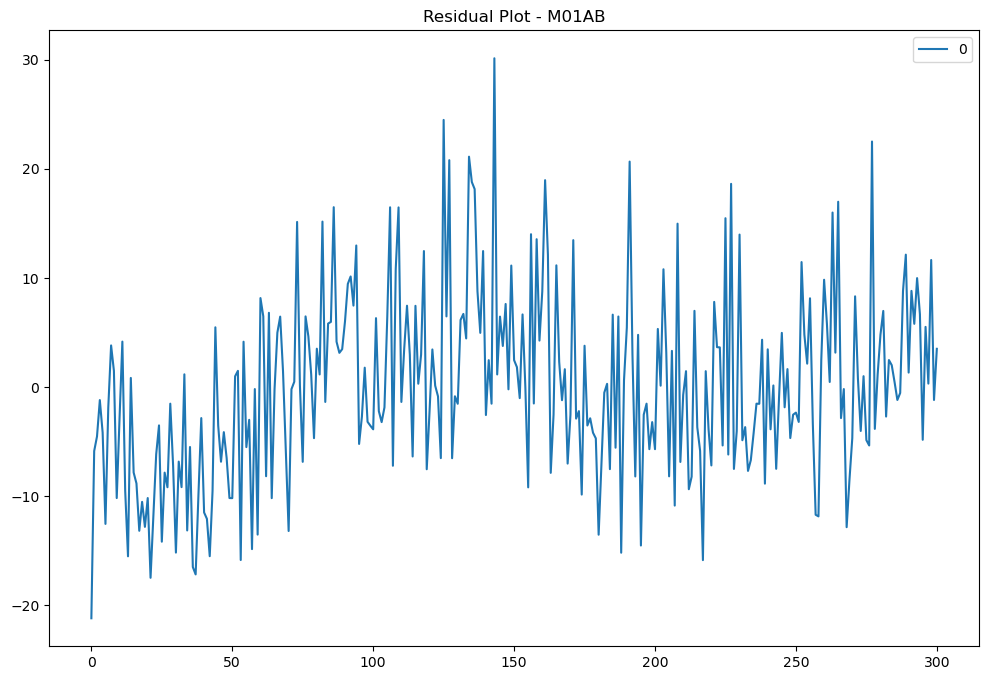

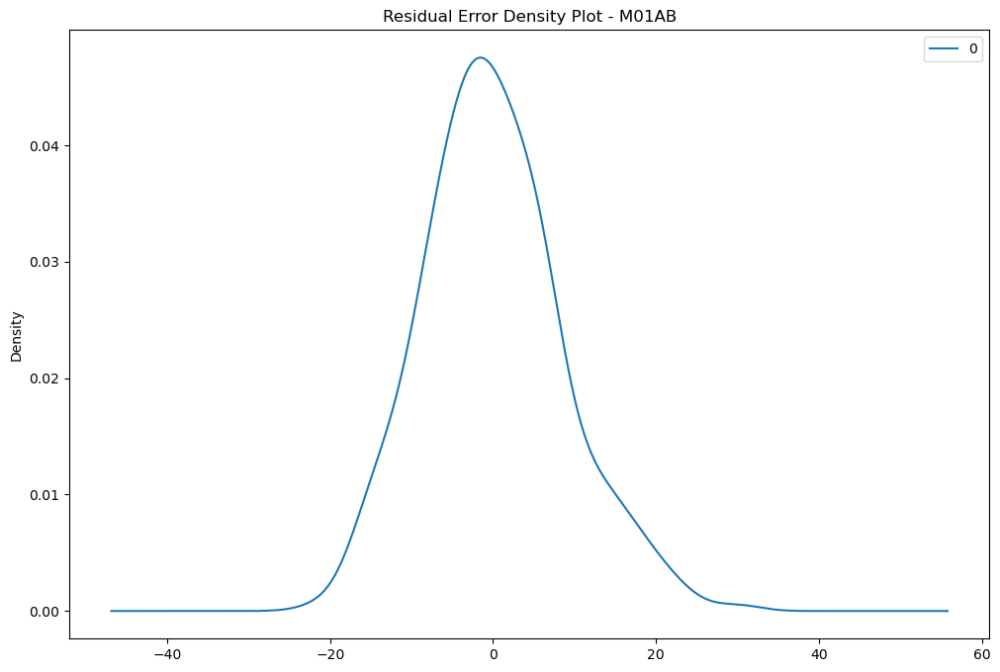

Residual Statistics - M01AB
                0
count  301.000000
mean     0.000005
std      8.484411
min    -21.193573
25%     -5.693573
50%     -0.543573
75%      4.986427
max     30.136427



Summary - M01AE
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  301
Model:                 ARIMA(2, 0, 0)   Log Likelihood                -987.302
Date:                Wed, 16 Oct 2024   AIC                           1982.604
Time:                        01:03:27   BIC                           1997.433
Sample:                             0   HQIC                          1988.538
                                - 301                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
c

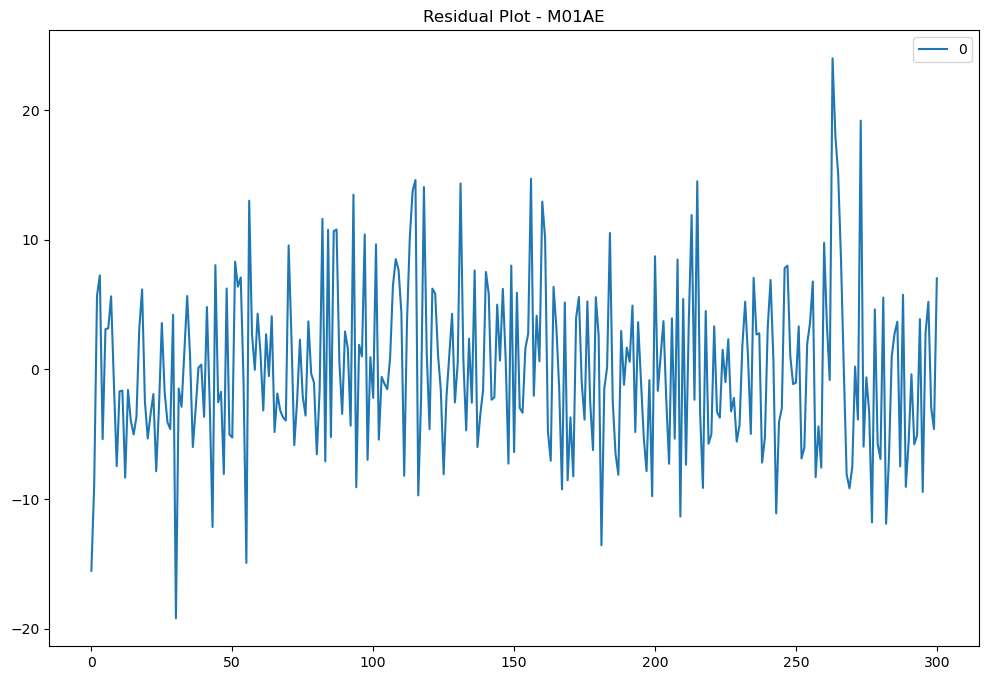

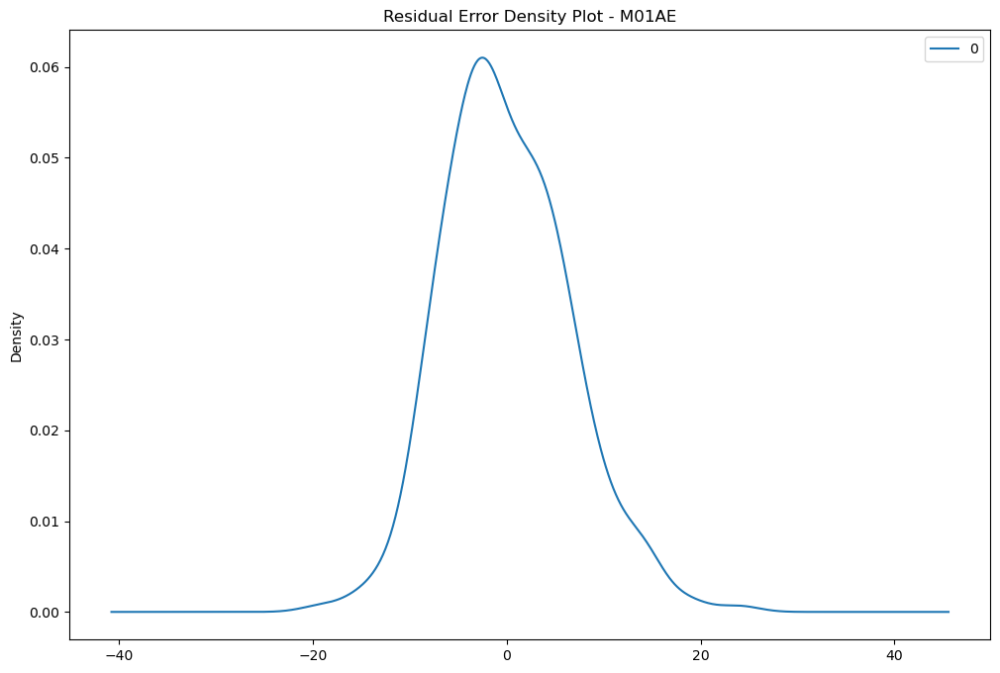

Residual Statistics - M01AE
                0
count  301.000000
mean     0.031151
std      6.449152
min    -19.184611
25%     -4.602401
50%     -0.827538
75%      4.095041
max     23.984337



Summary - N02BA
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  301
Model:                 ARIMA(2, 1, 4)   Log Likelihood                -988.135
Date:                Wed, 16 Oct 2024   AIC                           1990.270
Time:                        01:03:27   BIC                           2016.197
Sample:                             0   HQIC                          2000.646
                                - 301                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
a

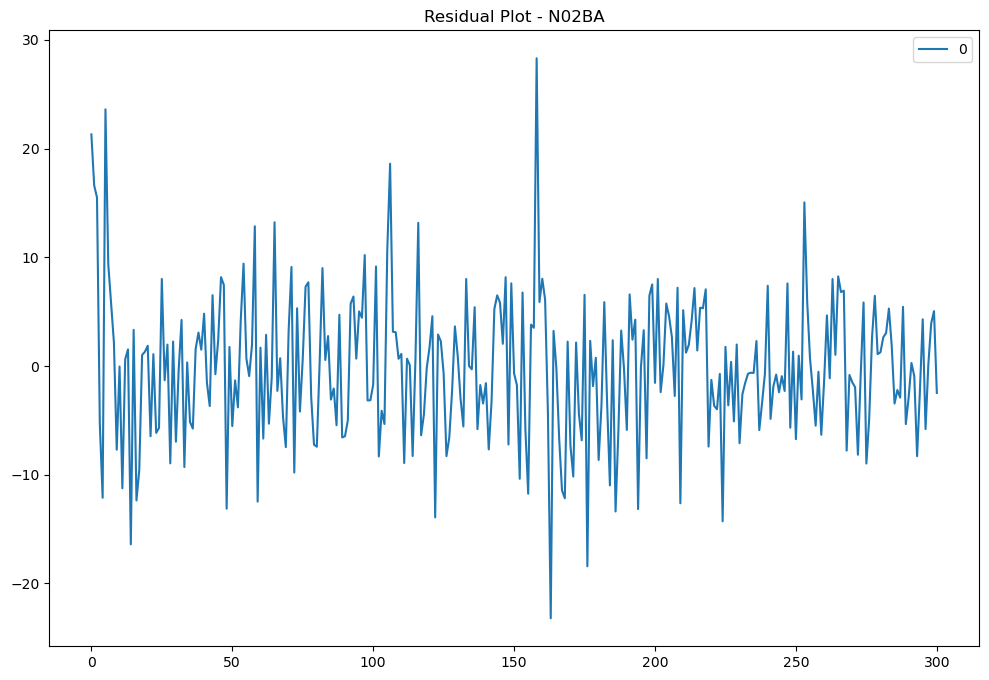

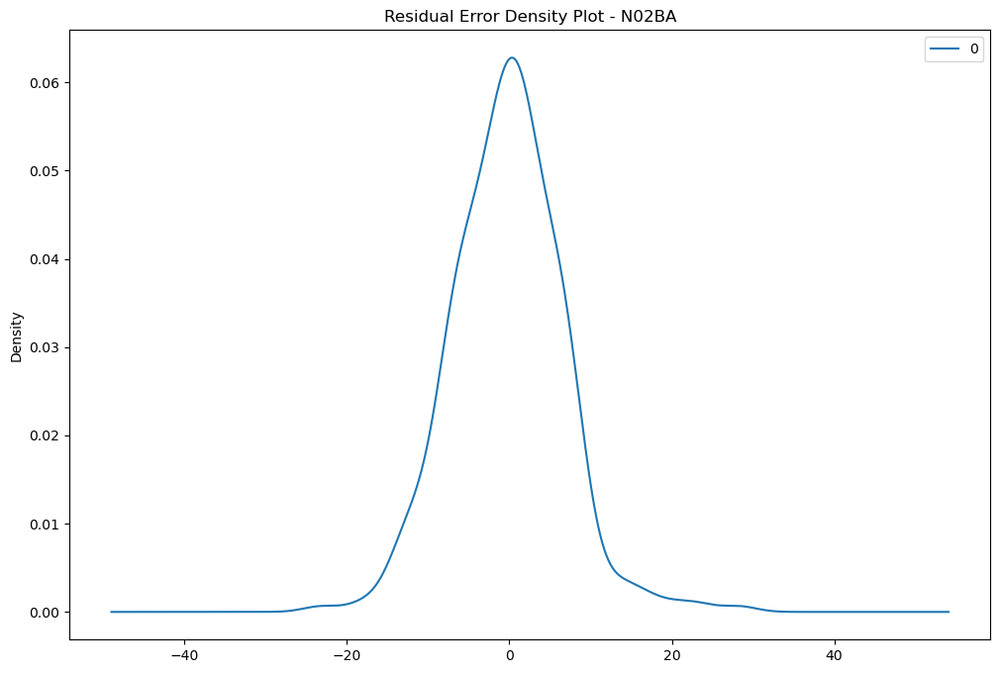

Residual Statistics - N02BA
                0
count  301.000000
mean    -0.214521
std      6.685182
min    -23.209132
25%     -4.869012
50%     -0.149111
75%      3.915336
max     28.302623



Summary - N02BE
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  301
Model:                 ARIMA(2, 0, 0)   Log Likelihood               -1561.093
Date:                Wed, 16 Oct 2024   AIC                           3130.185
Time:                        01:03:28   BIC                           3145.014
Sample:                             0   HQIC                          3136.119
                                - 301                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
c

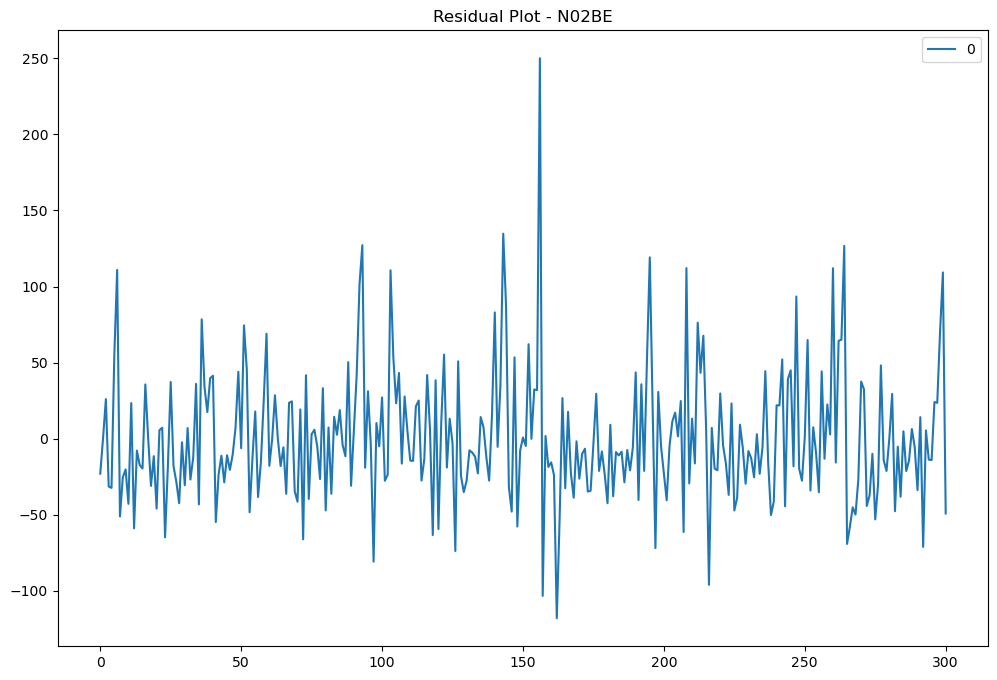

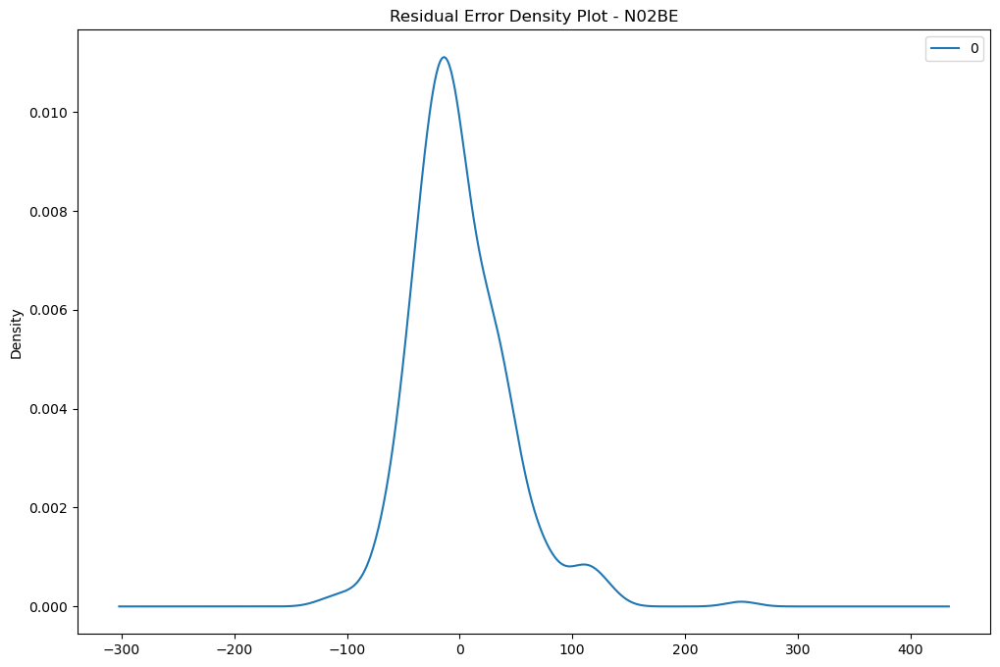

Residual Statistics - N02BE
                0
count  301.000000
mean     0.216216
std     43.270002
min   -118.152632
25%    -26.892689
50%     -6.288379
75%     23.484822
max    250.091270



Summary - N05B
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  301
Model:                 ARIMA(0, 0, 5)   Log Likelihood               -1305.582
Date:                Wed, 16 Oct 2024   AIC                           2625.165
Time:                        01:03:29   BIC                           2651.115
Sample:                             0   HQIC                          2635.549
                                - 301                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
co

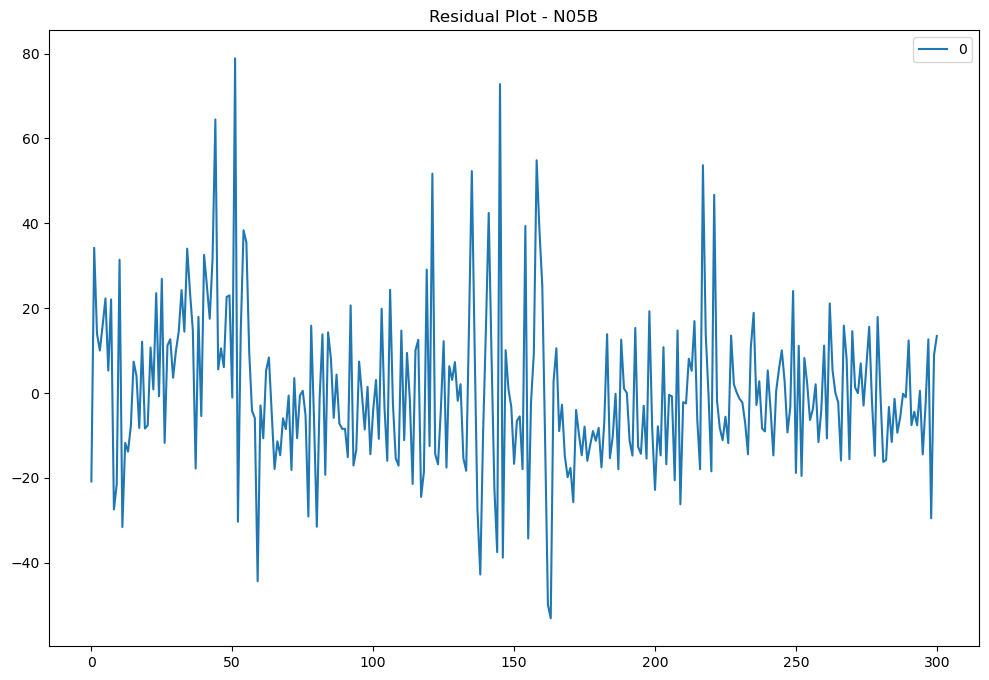

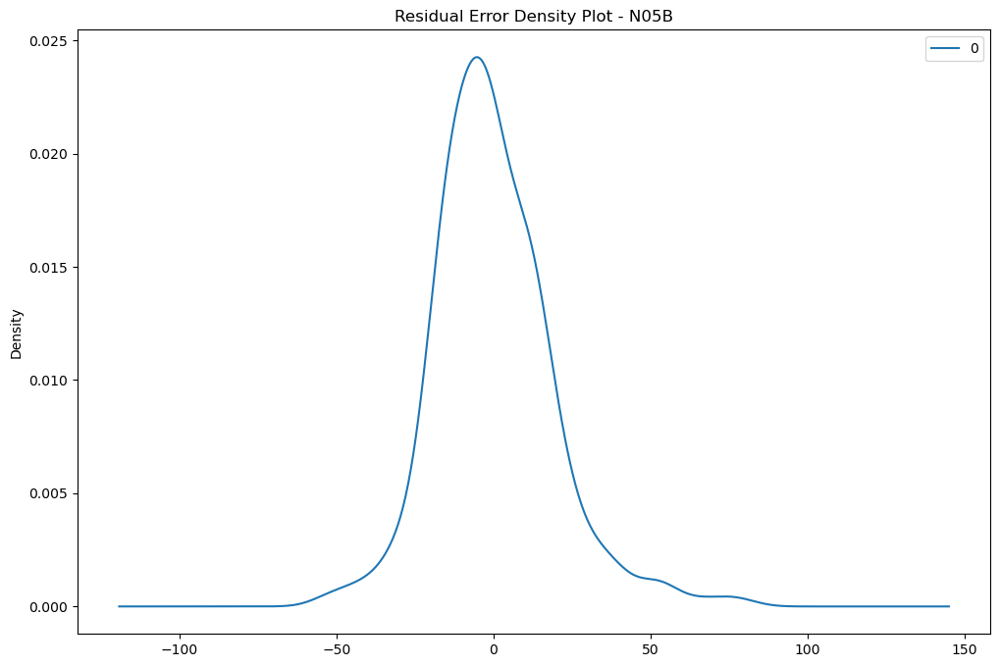

Residual Statistics - N05B
                0
count  301.000000
mean     0.026948
std     18.551001
min    -53.119534
25%    -11.579356
50%     -2.198794
75%     10.538967
max     78.899897



Summary - N05C
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  301
Model:                 ARIMA(0, 0, 1)   Log Likelihood                -767.036
Date:                Wed, 16 Oct 2024   AIC                           1540.071
Time:                        01:03:30   BIC                           1551.192
Sample:                             0   HQIC                          1544.521
                                - 301                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
con

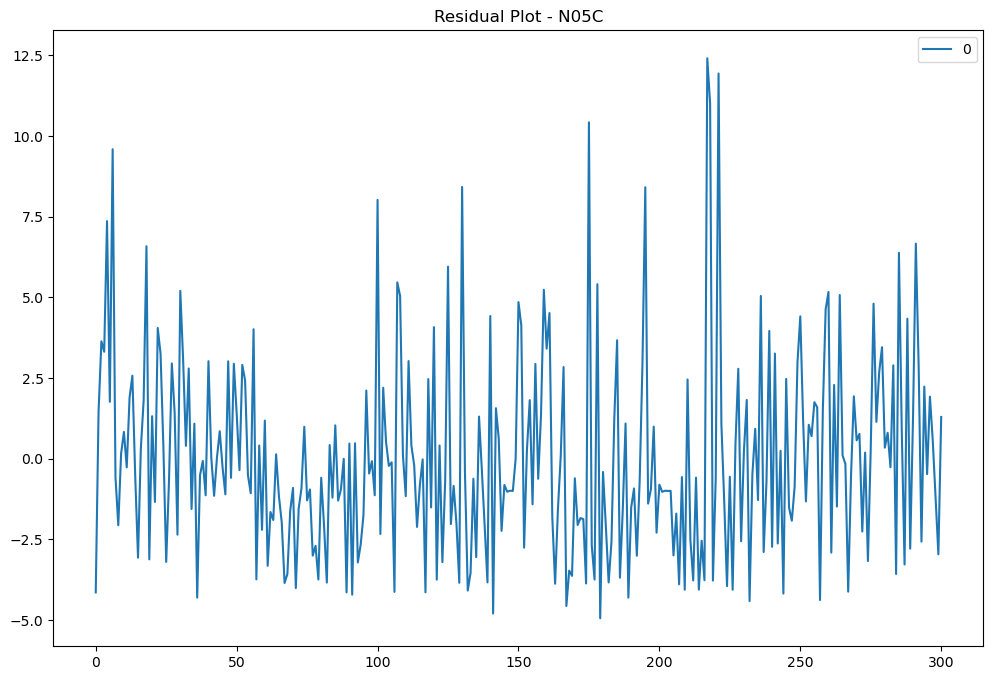

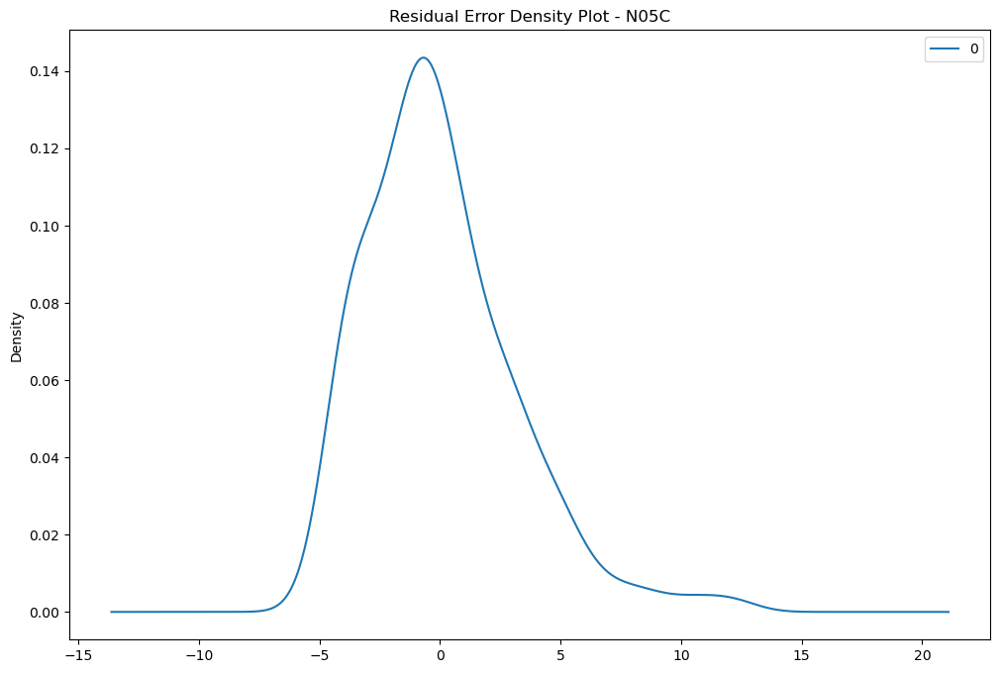

Residual Statistics - N05C
                0
count  301.000000
mean     0.001710
std      3.098888
min     -4.946227
25%     -2.094537
50%     -0.526102
75%      1.504399
max     12.413545



Summary - R03
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  301
Model:                 ARIMA(4, 1, 5)   Log Likelihood               -1306.425
Date:                Wed, 16 Oct 2024   AIC                           2632.850
Time:                        01:03:30   BIC                           2669.888
Sample:                             0   HQIC                          2647.672
                                - 301                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L

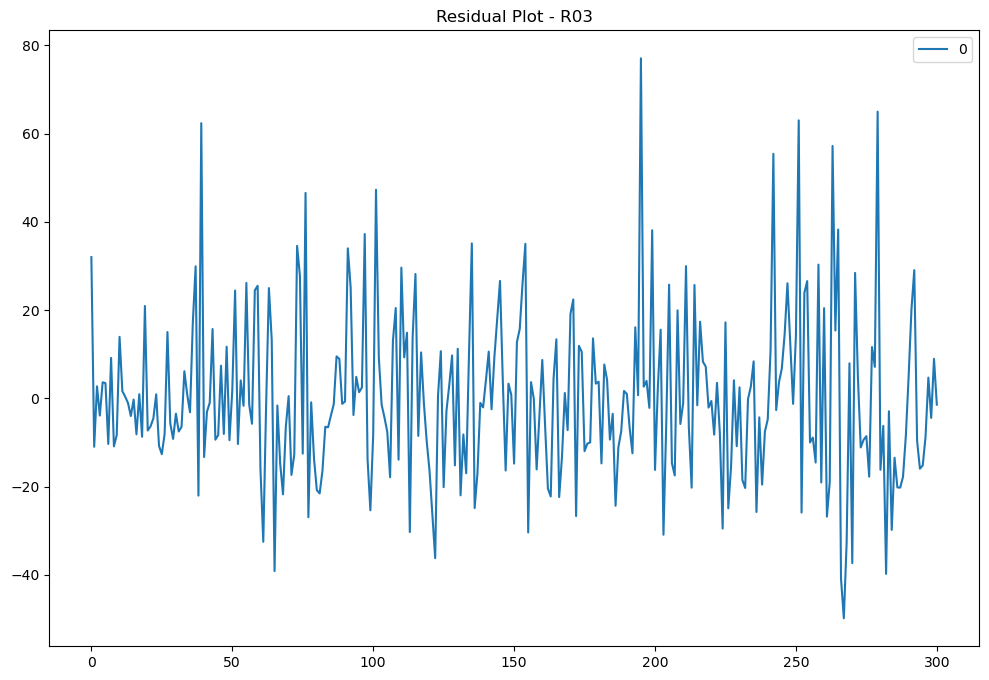

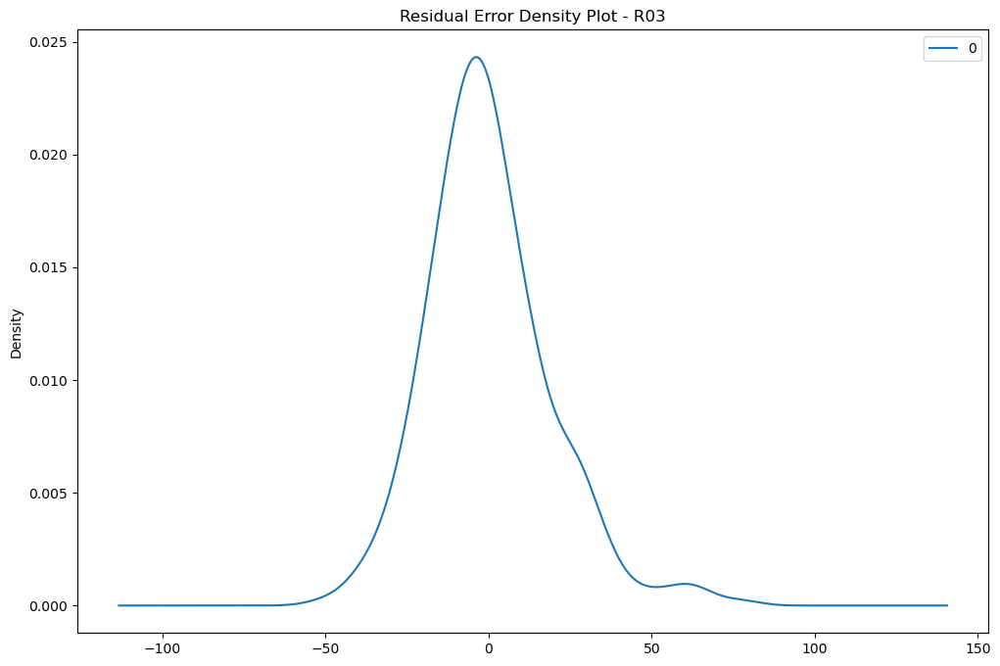

Residual Statistics - R03
                0
count  301.000000
mean     0.106795
std     18.905623
min    -49.869766
25%    -11.093420
50%     -1.590174
75%      9.715962
max     77.074539



Summary - R06
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  301
Model:                 ARIMA(5, 0, 5)   Log Likelihood               -1007.768
Date:                Wed, 16 Oct 2024   AIC                           2039.536
Time:                        01:03:31   BIC                           2084.021
Sample:                             0   HQIC                          2057.337
                                - 301                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const

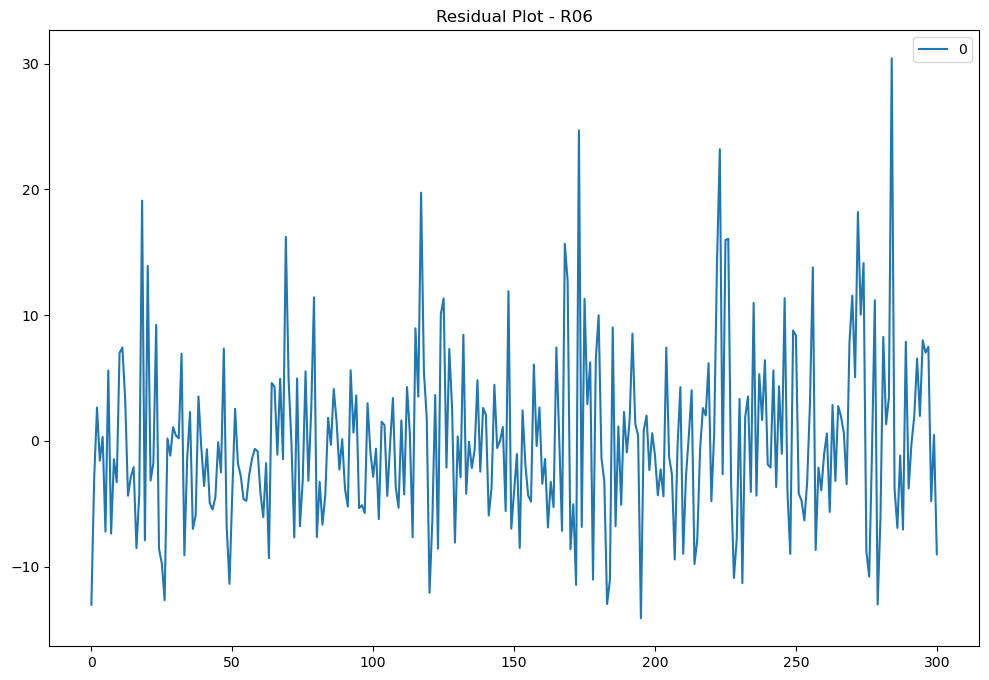

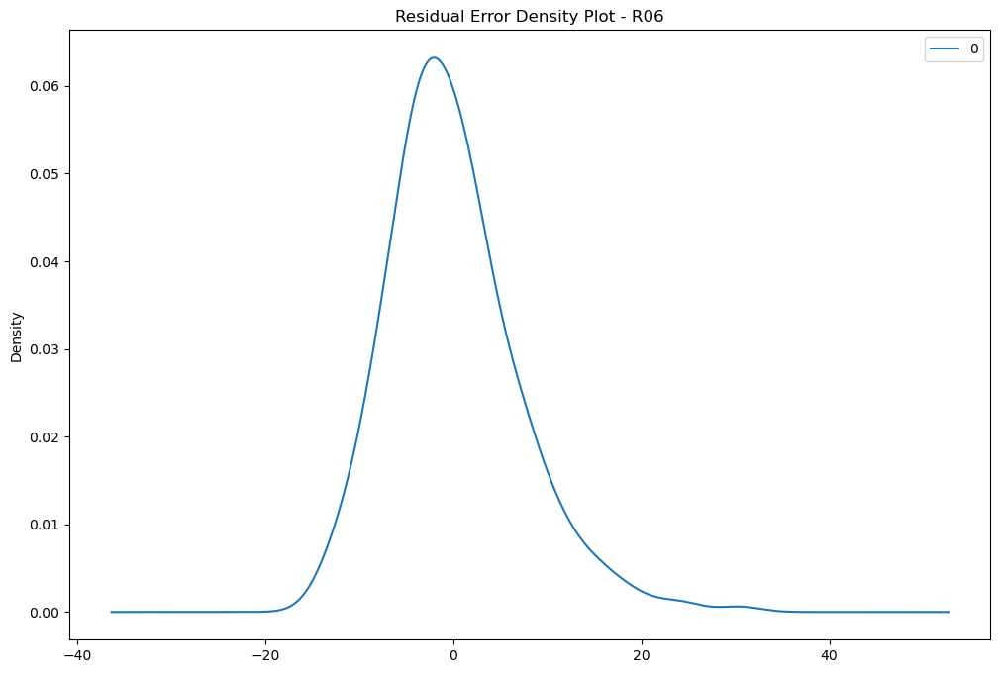

Residual Statistics - R06
                0
count  301.000000
mean    -0.034266
std      6.906452
min    -14.116232
25%     -4.386539
50%     -0.883159
75%      3.508446
max     30.423022





In [12]:
for drug, model_fit in model_fits.items():
    
    print(f"Summary - {drug}")
    print(model_fit.summary())
    
    residuals = pd.DataFrame(model_fit.resid)
    residuals.plot(title=f"Residual Plot - {drug}")
    plt.savefig(f"{folder_path}/Residual_Plot_{drug}.png")
    plt.show()
    
    residuals.plot(kind='kde', title=f"Residual Error Density Plot - {drug}")
    plt.savefig(f"{folder_path}/Density_Plot_{drug}.png")
    plt.show()
    
    print(f"Residual Statistics - {drug}")
    print(residuals.describe())
    print("\n\n")

    # acorr_ljungbox(residuals, np.arange(1, 11, 1))

In [20]:
from statsmodels.stats.diagnostic import acorr_ljungbox
for drug, model_fit in model_fits.items():
    residuals = pd.DataFrame(model_fit.resid)
    acorr_ljungbox(residuals, np.arange(1, 11, 1)) 

In [24]:
error_metrics_df

,Drug_Classification,ARIMA_MSE,ARIMA_MAPE,Auto-ARIMA_MSE,Auto-ARIMA_MAPE
0,M01AB,74.768467,2.273037e+01,NaN,NaN
1,M01AE,76.572677,3.298944e+01,NaN,NaN
2,N02BA,31.920933,2.957877e+01,NaN,NaN
3,N02BE,2615.907296,2.052417e+01,NaN,NaN
4,N05B,151.372279,1.906364e+01,NaN,NaN
5,N05C,7.949817,7.497824e+16,NaN,NaN
6,R03,651.398599,5.029962e+01,NaN,NaN
7,R06,76.474216,5.602905e+01,NaN,NaN


In [34]:
from pmdarima.datasets import load_lynx
from pmdarima.arima.utils import nsdiffs

lynx = load_lynx()

# estimate number of seasonal differences using a Canova-Hansen test
D = nsdiffs(weekly_df['M01AB'],
            m=52,  
            max_D=12,
            test='ch')  # -> 0

# or use the OCSB test (by default)
nsdiffs(weekly_df['M01AB'],
        m=52,
        max_D=12,
        test='ocsb')  # -> 0


0

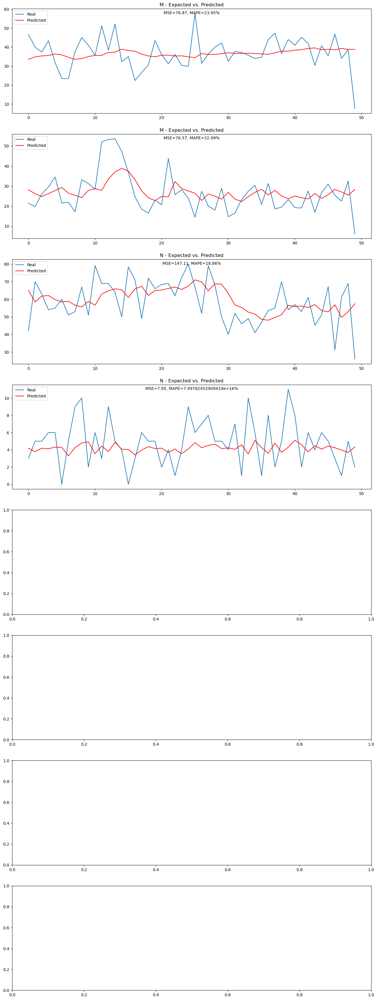

In [28]:

subplotindex=0
fig, ax = plt.subplots(8,1, figsize=(16,44))

warnings.filterwarnings("ignore")

for drug in ['M01AB','M01AE','N05B','N05C']:
    X = weekly_df[drug].values
    size = len(X)-50
    train, test = X[0:size], X[size:len(X)]
    history = [x for x in train]
    predictions = list()
    for t in range(len(test)):
        if (drug=='N02BA' or drug=='N02BE' or drug=='R03' or drug=='R06'):
            model = auto_arima(X, start_p=1, start_q=1,
                           max_p=5, max_q=5, m=52, max_d=1, max_D=1,
                           start_P=0, start_Q=0, max_P=5, max_Q=5, seasonal=True,
                           trace=False,
                           error_action='ignore',
                           suppress_warnings=True, 
                           stepwise=True)
        else:
            model = auto_arima(X, start_p=1, start_q=1,
                               max_p=5, max_q=5, max_d=1,
                           trace=False, seasonal=False,
                           error_action='ignore',
                           suppress_warnings=True, 
                           stepwise=True)
        model_fit = model.fit(history)
        output = model_fit.predict(n_periods=1)
        yhat = output[0]
        predictions.append(yhat)
        obs = test[t]
        history.append(obs)
        
    mse = mean_squared_error(test, predictions)
    mape = (mean_absolute_percentage_error(test, predictions))*100
    new_row = pd.DataFrame({'Drug_Classification': [drug], 'Auto-ARIMA_MSE': [mse], 'Auto-ARIMA_MAPE': [mape]})
    error_metrics_df = pd.concat([error_metrics_df, new_row], ignore_index=True)

    ax[subplotindex].set_title(drug+' - Expected vs. Predicted')
    ax[subplotindex].text(0.5, 0.96, 'MSE=' + str(round(mse, 2)) + ', MAPE=' + str(round(mape, 2)) + '%',
                            ha='center', va='center', transform=ax[subplotindex].transAxes,
                            fontsize=10)
    ax[subplotindex].plot(test, label='Real')
    ax[subplotindex].plot(predictions, color='red', label='Predicted')
    ax[subplotindex].legend(loc='upper left')
    subplotindex+=1
plt.show()

In [29]:
error_metrics_df

,Drug_Classification,ARIMA_MSE,ARIMA_MAPE,Auto-ARIMA_MSE,Auto-ARIMA_MAPE
0,M01AB,74.768467,2.273037e+01,NaN,NaN
1,M01AE,76.572677,3.298944e+01,NaN,NaN
2,N02BA,31.920933,2.957877e+01,NaN,NaN
3,N02BE,2615.907296,2.052417e+01,NaN,NaN
4,N05B,151.372279,1.906364e+01,NaN,NaN
5,N05C,7.949817,7.497824e+16,NaN,NaN
6,R03,651.398599,5.029962e+01,NaN,NaN
7,R06,76.474216,5.602905e+01,NaN,NaN
8,M01AB,NaN,NaN,76.873387,2.395163e+01
9,M01AE,NaN,NaN,76.568961,3.298952e+01


In [ ]:
# Long-term ARIMA

def evaluate_arima_model_lt(X, arima_order):
    size = int(len(X) - 50)
    train, test = X[0:size], X[size:]
    model = ARIMA(train, order=arima_order)
    model_fit = model.fit()
    forecast = model_fit.predict(1,len(test))
    error = mean_squared_error(test, forecast)
    return error

def evaluate_models_lt(drug, dataset, p_values, d_values, q_values):
    best_score, best_cfg = float("inf"), None
    for p in p_values:
        for d in d_values:
            for q in q_values:
                order = (p,d,q)
                try:
                    mse = evaluate_arima_model_lt(dataset, order)
                    if mse < best_score:
                        best_score, best_cfg = mse, order
                except:
                    continue
    print(drug+' - Best ARIMA%s MSE=%.3f' % (best_cfg, best_score))

p_values = range(0, 6)
d_values = range(0, 2)
q_values = range(0, 6)

warnings.filterwarnings("ignore")

for drug in drugs:
    evaluate_models_lt(drug, weekly_df[drug].values, p_values, d_values, q_values)


# Train the Model

In [ ]:
model = ARIMA(weekly_df['N02BA'], order=(5,1,1))
model_fit = model.fit()
# summary of fit model
print(model_fit.summary())
# line plot of residuals
residuals = DataFrame(model_fit.resid)
residuals.plot()
plt.show()
# density plot of residuals
residuals.plot(kind='kde')
plt.show()
# summary stats of residuals
print(residuals.describe())

In [ ]:
from pyramid.arima import auto_arima

subplotindex=0
numrows=2
numcols=2
fig, ax = plt.subplots(numrows, numcols, figsize=(18,15))
plt.subplots_adjust(wspace=0.1, hspace=0.3)

warnings.filterwarnings("ignore")

for x in ['M01AB','M01AE','N05B','N05C']:
    rowindex=math.floor(subplotindex/numcols)
    colindex=subplotindex-(rowindex*numcols)
    X = df[x].values
    size = len(X)-50
    train, test = X[0:size], X[size:len(X)]
    history = [c for c in train]
    predictions = list()
    for t in range(len(test)):
        if (x=='N02BA' or x=='N02BE' or x=='R03' or x=='R06'):
            model = auto_arima(X, start_p=1, start_q=1,
                           max_p=5, max_q=5, m=52, max_d=1, max_D=1,
                           start_P=0, start_Q=0, max_P=5, max_Q=5, seasonal=True,
                           trace=False,
                           error_action='ignore',
                           suppress_warnings=True, 
                           stepwise=True)
        else:
            model = auto_arima(X, start_p=1, start_q=1,
                           max_p=5, max_q=5, max_d=1,
                           trace=False, seasonal=False,
                           error_action='ignore',
                           suppress_warnings=True, 
                           stepwise=True)
        model_fit = model.fit(history)
        output = model_fit.predict(n_periods=1)
        yhat = output[0]
        predictions.append(yhat)
        obs = test[t]
        history.append(obs)
    error = mean_squared_error(test, predictions)
    perror = mean_absolute_percentage_error(test, predictions)
    resultsRollingdf.loc['AutoARIMA MSE',x]=error
    resultsRollingdf.loc['AutoARIMA MAPE',x]=perror
    ax[rowindex,colindex].set_title(x+' (MSE=' + str(round(error,2))+', MAPE='+ str(round(perror,2)) +'%)')
    ax[rowindex,colindex].legend(['Real', 'Predicted'], loc='upper left')
    ax[rowindex,colindex].plot(test)
    ax[rowindex,colindex].plot(predictions, color='red')
    subplotindex=subplotindex+1
plt.show()

In [ ]:
from multiprocessing import cpu_count
from joblib import Parallel
from joblib import delayed
from warnings import catch_warnings
from warnings import filterwarnings
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error
 
# one-step sarima forecast
def sarima_forecast(history, config):
 order, sorder, trend = config
 # define model
 model = SARIMAX(history, order=order, seasonal_order=sorder, trend=trend, enforce_stationarity=False, enforce_invertibility=False)
 # fit model
 model_fit = model.fit(disp=False)
 # make one step forecast
 yhat = model_fit.predict(len(history), len(history))
 return yhat[0]
 
# root mean squared error or rmse
def measure_mse(actual, predicted):
 return mean_squared_error(actual, predicted)
 
# split a univariate dataset into train/test sets
def train_test_split(data, n_test):
 return data[:-n_test], data[-n_test:]
 
# walk-forward validation for univariate data
def walk_forward_validation(data, n_test, cfg):
 predictions = list()
 # split dataset
 train, test = train_test_split(data, n_test)
 # seed history with training dataset
 history = [x for x in train]
 # step over each time-step in the test set
 for i in range(len(test)):
 # fit model and make forecast for history
 yhat = sarima_forecast(history, cfg)
 # store forecast in list of predictions
 predictions.append(yhat)
 # add actual observation to history for the next loop
 history.append(test[i])
 # estimate prediction error
 error = measure_mse(test, predictions)
 return error
 
# score a model, return None on failure
def score_model(data, n_test, cfg, debug=False):
 result = None
 # convert config to a key
 key = str(cfg)
 # show all warnings and fail on exception if debugging
 if debug:
 result = walk_forward_validation(data, n_test, cfg)
 else:
 # one failure during model validation suggests an unstable config
 try:
 # never show warnings when grid searching, too noisy
 with catch_warnings():
 filterwarnings("ignore")
 result = walk_forward_validation(data, n_test, cfg)
 except:
 error = None
 # check for an interesting result
 if result is not None:
 print(' > Model[%s] %.3f' % (key, result))
 return (key, result)
 
# grid search configs
def grid_search(data, cfg_list, n_test, parallel=True):
 scores = None
 if parallel:
 # execute configs in parallel
 executor = Parallel(n_jobs=cpu_count(), backend='multiprocessing')
 tasks = (delayed(score_model)(data, n_test, cfg) for cfg in cfg_list)
 scores = executor(tasks)
 else:
 scores = [score_model(data, n_test, cfg) for cfg in cfg_list]
 # remove empty results
 scores = [r for r in scores if r[1] != None]
 # sort configs by error, asc
 scores.sort(key=lambda tup: tup[1])
 return scores
 
# create a set of sarima configs to try
def sarima_configs(seasonal=[0]):
 models = list()
 # define config lists
 p_params = [0, 1, 2]
 d_params = [0, 1]
 q_params = [0, 1, 2]
 t_params = ['n','c','t','ct']
 P_params = [0, 1, 2]
 D_params = [0, 1]
 Q_params = [0, 1, 2]
 m_params = seasonal
 # create config instances
 for p in p_params:
 for d in d_params:
 for q in q_params:
 for t in t_params:
 for P in P_params:
 for D in D_params:
 for Q in Q_params:
 for m in m_params:
 cfg = [(p,d,q), (P,D,Q,m), t]
 models.append(cfg)
 return models
 
if __name__ == '__main__':
 # define dataset
 data = weekly_df['N02BA'].values
 print(data.shape)
 # data split
 n_test = 199
 # model configs
 cfg_list = sarima_configs()
 # grid search
 scores = grid_search(data, cfg_list, n_test)
 print('done')
 # list top 3 configs
 for cfg, error in scores[:3]:
 print(cfg, error)

In [ ]:
# Determine SARIMA parameters

p_values = range(0, 6)  # Autoregressive order (AR)
d_values = range(0, 2)  # Differencing order (I) - stationary, so d=0
q_values = range(0, 6)  # Moving average order (MA)
P_values = range(0, 2)  # Seasonal autoregressive order
D_values = range(0, 1)  # Seasonal differencing order
Q_values = range(0, 2)  # Seasonal moving average order
m_values = [12]         # Seasonal period (monthly)

param_combinations = list(itertools.product(p_values, d_values, q_values, P_values, D_values, Q_values, m_values))

best_aic = float("inf")  
best_params = None

# Grid search
for parameters in param_combinations:
    order = parameters[:3]
    seasonal_order = parameters[3:]
    
    try:
        model = sm.tsa.SARIMAX(df_train, 
                               order=order, 
                               easonal_order=seasonal_order)
        result = model.fit(disp=False)
        aic = result.aic
        
        if not math.isinf(result.zvalues.mean()):
            print(order, seasonal_order, aic)
        
            if aic < best_aic:
                best_aic = aic
                best_params = params
                
        else:
            print(order, seasonal_order, 'not converged')

    except:
        continue

# Print the best parameters and AIC
print("Best Parameters:", best_params)
print("Best AIC:", best_aic)

In [ ]:
# Define SARIMA parameters 

p, d, q = 1, 1, 1
P, D, Q, s = 1, 1, 1, 12 
  
# Fit the SARIMA model 
model = SARIMAX(daily_df['M01AB'], order=(p, d, q), seasonal_order=(P, D, Q, s)) 
results = model.fit() 
model 

In [ ]:
observed = monthly_sales[-forecast_periods:] 
mae = mean_absolute_error(observed, forecast_mean) 
mse = mean_squared_error(observed, forecast_mean) 
print(f'MAE: {mae}') 
print(f'MSE: {mse}')

In [ ]:
observed = monthly_sales[-forecast_periods:] 
mae = mean_absolute_error(observed, forecast_mean) 
mse = mean_squared_error(observed, forecast_mean) 
print(f'MAE: {mae}') 
print(f'MSE: {mse}')

In [ ]:
SARIMAXmodel = SARIMAX(y, order = (5, 4, 2), seasonal_order=(2,2,2,12))
SARIMAXmodel = SARIMAXmodel.fit()

y_pred = SARIMAXmodel.get_forecast(len(test.index))
y_pred_df = y_pred.conf_int(alpha = 0.05) 
y_pred_df["Predictions"] = SARIMAXmodel.predict(start = y_pred_df.index[0], end = y_pred_df.index[-1])
y_pred_df.index = test.index
y_pred_out = y_pred_df["Predictions"] 
plt.plot(y_pred_out, color='Blue', label = 'SARIMA Predictions')
plt.legend()